In [2]:
from dask.distributed import Client
import multiprocessing

ncpu = multiprocessing.cpu_count()
nworker = 8
threads = ncpu // nworker
print(ncpu, threads, nworker)

client = Client(
    processes=False, threads_per_worker=threads, n_workers=nworker, memory_limit="64GB"
)
client

72 9 8


/work/mh0727/m300524/conda-envs/mistral/lib/python3.8/site-packages/distributed/node.py:151: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 36626 instead
  warnings.warn(


Client Scheduler: inproc://10.50.42.52/36072/29 Dashboard: http://localhost:8888/proxy/36626/status,Cluster Workers: 8 Cores: 72 Memory: 512.00 GB


In [3]:
%load_ext lab_black

In [4]:
import xarray as xr

xr.set_options(keep_attrs=True)
import os
import dask
import numpy as np
import pandas as pd
import warnings

warnings.simplefilter("ignore")

from tqdm.notebook import tqdm
import xskillscore as xs
import regionmask
import geopandas
import esmtools as et
from esmtools.stats import rm_trend
import pymistral

In [5]:
# plotting options
import matplotlib.pyplot as plt
import matplotlib as mpl

# import cmocean
import seaborn as sns

%matplotlib inline
mpl.rcParams["savefig.dpi"] = 300
mpl.rcParams["savefig.pad_inches"] = 0
mpl.rcParams["savefig.format"] = "eps"
savefig = False
sns.set_context("notebook")
# mpl.rcParams

# PMassim ATM setup

In [6]:
# post
from basics import to_zarr, load_var_cdo, output_df2, output_df, _maybe_auto_chunk

# paths
from basics import (
    c,
    outpath,
    exppath,
    postpath,
    atmvarlist,
    oceanvarlist,
    vars_to_cmorize,
    ocean_zarr,
    atm_zarr,
)

# runs
from basics import direct_run, indirect_run, run_dict

# area
from basics import ocean_area, land_area, global_agg, yearmean, var_area

# metadata
from basics import (
    latexify_units,
    add_showname,
    convert_C,
    kgC_s_to_PgC_month,
    showname_dict,
)

long_name_rename_dict = showname_dict

# plot
from basics import add_figurelabels, c_dict, annotate_figurelabels

# misc
from basics import clean

In [7]:
targetyear = 1850  # nudge years starting from this over baseyear restart file
baseyear = 2006  # restart file from vga0220a

In [8]:
from basics import metrics, metric_shortname, metric_longname

In [9]:
# first row in log table
runs_raw = [
    "SSTSSS",
    "SSTSSSISDICSALK",
    "ATMSSTSSSISDICSALK",
    "ATM",
    "ATMsfn",
    "TS",
    "TSI",
    "TSIDICALK",
    "TSIDICALK2",
    "ATMsfnTS",
    "ATMsfnTSI",
    "ATMsfnTSI2",
    "ATMTS",
    "ATMTSI",
    "ATMTSI2",
    "ATMTSI3" "ATMsfnTSIDICALK",
    "ATMTSINUT",
    "ATMTSIDICALK",
    "ATMTSIDICALK2",
    "ATMTSIDICALKNUT",
    "ATMTSIrhamocc",
    "ATMTSIlandrveg",
    "ATMTSIlandrnosurf",
    "ATMTSIDICALKlandrall",
    "ATMTSIDICALKlandrall5",
    "ATMTSIDICALKlandralls",
    c,
]
len(runs_raw)

# how to rename ATMTSI3

27

In [10]:
run_rename_dict = dict()
run_rename_dict["ATMsfnTSI"] = "ATMsfnTS2"  # forgot ice nudging
run_rename_dict["ATMsfnTSIDICALK"] = "ATMsfnTSDICALK"  # forgot ice nudging
run_rename_dict["ATMTSI"] = "ATMTS2"  # forgot ice nudging
run_rename_dict["ATMTSIDICALK"] = "ATMTSDICALK"  # forgot ice nudging
run_rename_dict["TSI"] = "TS2"  # forgot ice nudging
run_rename_dict["TSIDICALK"] = "TSDICALK"  # forgot ice nudging
run_rename_dict["SSTSSSISDICSALK"] = "SSTSSSSDICSALK"  # forgot ice nudging
run_rename_dict["ATMSSTSSSISDICSALK"] = "ATMSSTSSSSDICSALK"  # forgot ice nudging
run_rename_dict["ATMTSIDICALK2"] = "ATMTSIDICALK"  # rerun with ice
run_rename_dict["TSIDICALK2"] = "TSIDICALK"  # rerun with ice
run_rename_dict["ATMTSI2"] = "ATMTSI2"  # rerun with ice
run_rename_dict["ATMsfnTSI2"] = "ATMsfnTSI"  # rerun with ice
run_rename_dict["ATMsfnTSIDICALK2"] = "ATMsfnTSIDICALK"  # rerun with ice
run_rename_dict[
    "ATMTSIlandrveg"
] = "ATMTSIlandrall"  # restart files annualy on all streams
run_rename_dict["ATMTSIDICALKlandrall"] = "ATMTSIDICALKlandr1" # not dicrain
run_rename_dict["ATMTSIDICALKlandrall5"] = "ATMTSIDICALKlandR"
run_rename_dict["ATMTSIDICALKlandrall2"] = "ATMTSIDICALKland2"
run_rename_dict["ATMTSI3"] = "ATMTSI"
run_rename_dict["ATMTSIDICALKlandralls"] = "ATMTSIDICALKlandr"

In [62]:
dszr.run

<xarray.DataArray 'run' (run: 6)>
array(['vga0220a_Rerun', 'ATMTSI', 'ATMTSIDICALKlandr1', 'ATMTSIDICALKlandR',
       'ATMTSIDICALKlandr', 'ATMTSIrhamocc'], dtype='<U18')
Coordinates:
  * run      (run) <U18 'vga0220a_Rerun' 'ATMTSI' ... 'ATMTSIrhamocc'

In [ ]:
['indirect','remove','directLR5','directLR1','directOR1']

In [11]:
runs_renamed = [run_rename_dict.get(i, i) for i in runs_raw]
# runs_renamed

# Load output

In [12]:
v = "co2_flx_land"  # "co2_flux"
timestr = ""
nyears = 48
start = 1850
end = start + nyears
timestr = str(start)[: -len(str(nyears))]
timestr

pa = {"robust": True, "yincrease": output_df2.loc[v]["model"] in ["echam6", "jsbach"]}
pa

{'robust': True, 'yincrease': True}

In [13]:
runs_raw_minimum = [c, "ATM", "TS", "ATMTSI3", "ATMTSIDICALKlandralls"]
# runs_raw_minimum_label = ['perfect']

In [14]:
cmorized_vars = !ls /work/bm1124/m300524/experiments/asp_PMassim_reconATMTSIDICALKlandralls_init1894_m004/outdata/jsbach/*Lmon*.nc
cmorized_vars = [v.split("_")[-1].replace(".nc", "") for v in cmorized_vars]
for s in ["global", "mean", "mass", "area"]:
    cmorized_vars = [v for v in cmorized_vars if s not in v]

cmorized_output = pd.DataFrame(columns=output_df2.columns, index=cmorized_vars)
cmorized_output["model"] = "jsbach"
cmorized_output["outdatatype"] = "Lmon"
cmorized_output["stream"] = "jsbach_Lmon"

output_df2 = output_df2.append(cmorized_output)

## to netcdf

In [15]:
runs_raw_minimum_more = [
    c,
    "ATM",
    "TS",
    "ATMTSI3",
    "ATMTSIDICALKlandrall",
    "ATMTSIDICALKlandrall5",
    "ATMTSIDICALKlandrall2",
    "ATMTSIDICALKlandralls",
    "ATMTSIrhamocc",
]

In [16]:
import cdo

cdo = cdo.Cdo(tempdir="/work/mh0727/m300524/tmp/.")

lat = xr.open_dataset(
    "/work/bm1124/m300524/experiments/sample_files/jsbach_veg_mm.nc"
).lat


def process_var(v=v, runs_raw=runs_raw_minimum_more):
    # print(f'find {runs_raw}')
    sel = "" if v != "CO2" else ",levidx=47"

    ds_list = []
    sel += f",year={start}/{end}"

    for run in tqdm(runs_raw):
        expid = (
            f"asp_esmControl_PMassim_1850_{run}_over_2006" if "Rerun" not in run else c
        )
        try:
            if output_df2.loc[v]["outdatatype"] != "Lmon":
                ds = load_var_cdo(
                    exppath=exppath,
                    var=v,
                    expid=expid,
                    timestr=timestr,
                    sel=sel,
                    output_df=output_df2,
                )[v].squeeze()
                if output_df2.loc[v].model in ["jsbach", "echam6"]:
                    ds = ds.sortby(ds.lat)
            else:
                p = f"{exppath}/{expid}/outdata/jsbach/{expid}_Lmon_{v}.nc"
                ds = cdo.select(f"name={v}", input=p, returnXDataset=True)[v]
        except Exception as e:
            print(f"run {run} not found because {type(e).__name__}:{e}\n")
            print("output_df2:", output_df2.loc[v])
            runs_raw = runs_raw.copy()
            runs_raw.remove(run)
        ds["time"] = xr.cftime_range(start=str(start), freq="MS", periods=ds.time.size)
        ds = ds.sel(time=slice(str(start), str(end)))
        ds_list.append(ds)
    ds = xr.concat(ds_list, "run")
    ds["run"] = [run_rename_dict.get(i, i) for i in runs_raw]
    return ds

In [17]:
v = "cVeg"
# ds = process_var(v=v, runs_raw=runs_raw_minimum)
# sns.set_palette('Set2',3)
# yearmean(convert_C(ds.mean(['x','y']))).plot(hue='run')

## to zarr

### many variables from all runs

In [18]:
#!ls -all /work/mh0727/m300524/191008_PM_assim/post

In [19]:
import shutil

# shutil.rmtree(atm_zarr)

In [20]:
# shutil.rmtree(ocean_zarr)

In [21]:
#%time to_zarr(atmvarlist, name="atm", process_var=process_var)

In [22]:
vars_to_cmorize = [
    "cVeg",
    "cLand",
    "netAtmosLandCO2Flux",
    "nep",
    "nbp",
    "npp",
    "gpp",
    "rh",
    "cSoil",
    "fco2nat",
    "cLitter",
]

In [23]:
#%time to_zarr(vars_to_cmorize, name="atm", process_var=process_var)

In [24]:
#%time to_zarr(oceanvarlist, name="ocean",process_var=process_var)

### add new run to existing zarr

In [25]:
new_runs = (
    []
)  # ['ATMTSIDICALKlandrall2']#['ATMTSIDICALKlandrall',"ATMTSIDICALKlandrall5"]

from basics import add_varlist_of_runs_to_zarr

for new_run in new_runs:
    for i, (z, varlist) in enumerate(
        zip([atm_zarr, ocean_zarr], [atmvarlist, oceanvarlist])
    ):
        add_varlist_of_runs_to_zarr(z, varlist, [new_run])

## Misc

In [26]:
def diff_c(ds):
    return ds.drop_sel(run=c) - ds.sel(run=c)

In [27]:
months = [
    "Jan",
    "Feb",
    "Mar",
    "Apr",
    "May",
    "Jun",
    "Jul",
    "Aug",
    "Sep",
    "Oct",
    "Nov",
    "Dec",
]


def split_into_months(dss):
    dss2 = []
    time = dss.sel(time=dss.time.dt.month == 1).time.dt.year.values
    for m in np.arange(1, 13):
        dss22 = dss.sel(time=dss.time.dt.month == m)
        dss22["time"] = time
        dss2.append(dss22)
    dss2 = xr.concat(dss2, dim="month")
    dss2["month"] = np.arange(1, 13)
    return dss2

## metrics

In [28]:
def bias(rec, target, dim):
    return (rec - target).mean(dim)


def metric_over_time(ds, control=None, metric="pearson_r", window=10, dim="time"):
    if c in ds.run:
        if control is None:
            control = ds.sel(run=c)
        ds = ds.drop_sel(run=c)
    i = 0
    res = []
    time_label = []
    while i < ds[dim].size - window:
        time_label.append(f"{i}-{i+window}")
        ds_part = ds.isel({dim: slice(i, i + window)})
        control_part = control.isel({dim: slice(i, i + window)})
        if metric in ["pearson_r", "rmse", "mae", "mse"]:
            res.append(
                getattr(xs, metric)(
                    *xr.broadcast(control_part, ds_part), dim=dim, skipna=False
                )
            )
        elif metric == "bias":
            res.append(bias(ds_part, control_part, dim))
        i += 1
    res = xr.concat(res, "time")
    # res['time']=time_label
    return res

In [29]:
def metrics_over_time(dszsm, metrics=["pearson_r", "rmse"], window=10):
    R = xr.concat(
        [
            metric_over_time(dszsm, dszsm.sel(run=c), metric=m, window=window)
            for m in metrics
        ],
        "metric",
    )
    R["metric"] = metrics
    # R['month']=months
    return R

In [30]:
def resample_target_metrics(
    dszsm, metrics=["pearson_r", "rmse"], iterations=50, dim="time", periods=10
):
    metrics = [metric for metric in metrics if hasattr(xs, metric)]
    t1 = []
    t2 = []
    init = dszsm
    time = xr.cftime_range(start="2000", periods=periods)
    idx = np.linspace(
        (np.arange(init[dim].size - time.size)),
        (np.arange(init[dim].size - time.size)),
        iterations,
        dtype="int",
    )
    # shuffle each line
    for ndx in np.arange(iterations):
        np.random.shuffle(idx[ndx])
    idx_da = xr.DataArray(
        idx,
        dims=("iteration", dim),
        coords=(
            {
                "iteration": range(iterations),
                dim: init[dim].isel({dim: slice(None, -time.size)}),
            }
        ),
    )
    for i in range(iterations):
        tt1 = idx_da.isel(iteration=i, time=0).values
        tt2 = idx_da.isel(iteration=i, time=1).values
        # print(tt2, tt1)

        t1.append(
            dszsm.sel(run=c)
            .isel(time=slice(tt1, tt1 + time.size))
            .assign_coords(time=time)
        )
        t2.append(
            dszsm.sel(run=c)
            .isel(time=slice(tt2, tt2 + time.size))
            .assign_coords(time=time)
        )
    t1 = xr.concat(t1, "iteration")
    t2 = xr.concat(t2, "iteration")
    r = xr.concat([getattr(xs, metric)(t1, t2, "time") for metric in metrics], "metric")
    r["metric"] = metrics
    return r

In [31]:
#%time rtm = resample_target_metrics(dszsm,iterations=500)

# tracking performance

In [32]:
CUT = 10

In [33]:
iterations = 50

In [34]:
q_high = 0.95
q_low = 0.05

In [35]:
run_metrics = ["bias", "mae", "pearson_r", "rmse"]

In [36]:
indirect_runs = ["TS", "ATM", "ATMTSI", c]

In [37]:
mpl.rcParams["savefig.dpi"] = 150

## functions spatial maps

In [38]:
import textwrap

mpl.rcParams["savefig.dpi"] = 300


def label_from_attrs(da, extra="", width=30):
    """Makes informative labels if variable metadata (attrs) follows
    CF conventions."""

    if da.attrs.get("long_name"):
        name = da.attrs["long_name"]
    elif da.attrs.get("standard_name"):
        name = da.attrs["standard_name"]
    elif da.name is not None:
        name = da.name
    else:
        name = ""

    if da.attrs.get("units"):
        units = " [{}]".format(da.attrs["units"])
    else:
        units = ""

    return "\n".join(textwrap.wrap(name + extra + units, width=width))


plt.rcParams.update({"hatch.color": "gray"})


def plot_map_contour(tp, savefig=True, map_contour=True, **kwargs):

    # todo:
    # -rm boundary stippling

    def f(
        tp,
        linewidth=0.5,
        lev=[-1, 1],
        hatching_style="....",
        **kwargs,
    ):
        kwargs["levels"] = lev
        kwargs["colors"] = "white"
        del kwargs["cmap"]
        v = tp.name
        metric = str(tp.metric.values)
        plot = "contour"
        if metric == "bias":
            # tp_map = tp/std[v]
            tp_map = tp / rt_mae[v]
            fmt = "%i std"
            plot = "shading"
        elif metric == "pearson_r":
            tp_map = tp / rt_pearson_r[v]  # greater one: tp better rt
            fmt = "95$^{th}$"
            plot = "shading"
        elif metric == "rmse":
            tp_map = tp / rt_rmse[v]  # lower one: tp better rt
            fmt = "5$^{th}$"
            plot = "shading"
        elif metric == "mae":  # lower one: tp better rt
            tp_map = tp / rt_mae[v]
            fmt = "5$^{th}$"
            plot = "shading"
        # fix lon # apperently not needed
        # if "lon" in tp_map.coords:
        #    tp_map["lon"] = tp["lon"]
        # if "longitude" in tp_map.coords:
        #    tp_map["longitude"] = tp["longitude"]

        # contour
        if plot == "contour":
            kwargs["levels"] = [1]
            CS = tp_map.plot.contour(
                alpha=1, linewidths=[linewidth] * len(kwargs["levels"]), **kwargs
            )
            kwargs["ax"].clabel(CS, inline=True, fontsize=8, fmt=fmt)
        # stippling
        elif plot == "shading":
            kwargs["colors"] = "none"
            if metric == "bias":  # larger hatched
                kwargs["levels"] = [-np.inf, -1, 1, np.inf]
                kwargs["hatches"] = [hatching_style, "", hatching_style]
            elif metric == "pearson_r":  # smaller one hatched
                kwargs["levels"] = [0, 1, np.inf]
                kwargs["hatches"] = [hatching_style, ""]
                # kwargs["levels"] = [-np.inf, 1, np.inf]
                # kwargs["hatches"] = ["", hatching_style]
            elif metric in ["rmse", "mae"]:
                kwargs["levels"] = [0, 1, np.inf]  # larger hatched
                kwargs["hatches"] = ["", hatching_style]
            # print(metric, v, kwargs["levels"], kwargs["hatches"])
            CS = tp_map.plot.contourf(**kwargs)
            kwargs["ax"].set_global()
        return CS

    metric_str = str(tp.metric.values)
    if "cmap" not in kwargs:
        if metric_str == "pearson_r":
            kwargs["cmap"] = "viridis"
        elif metric_str in ["rmse", "mae"]:
            kwargs["cmap"] = "viridis_r"
        elif metric_str in ["bias"]:
            kwargs["cmap"] = "RdBu_r"

    if "aspect" in kwargs:
        aspect = kwargs.pop("aspect")
    else:
        aspect = 1.7

    v = tp.name
    if v in ["co2_flx_land", "box_Cpools_total"]:
        kwargs["feature"] = "ocean"
    elif v in ["co2_flx_ocean", "spco2", "fgco2"]:
        kwargs["feature"] = "land"
    elif v in ["CO2", "slp", "wind10", "u10", "v10", "temp2", "lai", "ws"]:
        kwargs["feature"] = None

    if map_contour:
        long_name = tp.attrs["long_name"]
        units = "" if metric_str == "pearson_r" else tp.attrs["units"]
        if long_name.startswith("Ocean mixed layer"):
            long_name = "Mixed layer depth"
        for s in ["mean", "total"]:
            if s in long_name:
                long_name = long_name.strip(s)
        # label = f"{long_name} {metric_shortname[metric_str]} [{units}]"
        label = f"{long_name} {metric_shortname[metric_str]} [{units}]"
        if len(label) > 25:
            label = (
                "\n".join(
                    textwrap.wrap(
                        f"{long_name} {metric_shortname[metric_str]}", width=25
                    )
                )
                + f"\n [{units}]"
            )
        else:
            label = "\n".join(
                textwrap.wrap(
                    f"{long_name} {metric_shortname[metric_str]} [{units}]", width=25
                )
            )
        cbar_kwargs_fg = {"pad": 0.02, "shrink": 0.5, "label": label, "aspect": 15}
        fg = tp.plot_map(col="run", cbar_kwargs=cbar_kwargs_fg, aspect=aspect, **kwargs)
    else:
        fg = tp.plot_map(col="run", aspect=aspect, **kwargs)

    v = fg.data.name
    label_counter = list(rt_mae.data_vars).index(v)
    for ax in fg.axes:
        annotate_figurelabels(ax, xy=(0.01, 0.9), shift=label_counter * 3)
        if label_counter == 0:
            runs = tp.run.values
            for ji, ii in enumerate(runs):
                ax[ji].set_title(f"reconstruction = {str(ii)}", fontsize="large")
            # ax[1].set_title("reconstruction = ATM", fontsize="large")
            # ax[2].set_title(
            #    "reconstruction = ATMTSI", fontsize="large"
            # )  # TS$_{\text{ocean}}$")
        else:
            for i in range(3):
                ax[i].set_title("")

    if map_contour:
        if "x" in tp.dims:
            x = "longitude"
            y = "latitude"
        elif "lon" in tp.dims:
            x = "lon"
            y = "lat"
        fg.map_dataarray(f, x=x, y=y, add_colorbar=False)
    if savefig:
        filename = f"map_{str(tp.metric.values)}_{str(tp.name)}_contour.png"
        plt.savefig(filename, bbox_inches="tight", pad_inches=0)
    label_counter = 0
    return fg

In [39]:
# plot_map_contour(tp.sel(metric="bias")[v])

In [40]:
# plot_map_contour(tp.sel(metric="rmse")[v])

In [41]:
# plot_map_contour(tp.sel(metric="pearson_r")[v])

In [42]:
def merge(metric="ACC", new_name="physics", contour="95th", rm=True, sort=True):
    import os
    from subprocess import call

    if "debiased" in metric:
        metric = metric.replace("debiased", "").strip("_")
        debiased = True
    else:
        debiased = False
    f = [f for f in os.listdir(".") if f"map_{metric}" in f]
    f = [i for i in f if "contour.png" in i]
    if sort:
        f.sort(key=os.path.getctime)
    # print('find:',f)
    new_metric_str = metric if not debiased else f"debiased_{metric}"
    new_file = f"map_{new_metric_str}_{new_name}_contour_{contour}.png"

    to_call = ["convert"] + f + ["-append", new_file]
    # print('call',to_call)
    call(to_call)
    if rm:
        # print('remove', f)
        for i in f:
            os.remove(i)
    return new_file

In [43]:
from basics import reset_attrs


def debias(dsz, how="mean", ta="guess", cut=CUT):
    """Remove first cut years and rm mean or detrend."""
    dsz = dsz.isel(time=slice(cut, None))
    if ta == "guess":
        if "month" in dsz.coords:
            ta = "month"
        else:
            ta = "annual"
    if how == "mean":
        if ta == "annual":
            dsz = dsz - dsz.mean("time")
        elif ta == "month":
            dsz = dsz - dsz.mean("time")
            del dsz["month"]
    elif how == "detrend":
        dsz = reset_attrs(rm_trend(dsz), dsz)
    else:
        raise ValueError("fix how")
    return dsz


how_debias = "detrend"

## physics

### atmosphere (Spring 2021 Figs. 1 & 2)

In [44]:
new_name = "atm_physics"

In [45]:
atmvarlist_physics = ["temp2", "precip", "u10", "v10"]
# atmvarlist_physics = ['temp2','precip','co2_flx_land','co2_flx_ocean'] # for SAB poster

In [43]:
dsz = xr.open_zarr(atm_zarr)[atmvarlist_physics]
dsz = clean(convert_C(dsz)).sel(run=indirect_runs)
dszym = yearmean(dsz).chunk({"time": -1}).persist()
dszym = dszym[list(dszym.data_vars)[::-1]]

#### ym tracking performance maps

In [66]:
mean = dszym.sel(run=c).mean("time").compute()
std = dszym.sel(run=c).std("time").compute()

tp = metrics_over_time(dszym, metrics=run_metrics).mean("time").compute()
tp = tp.map(latexify_units)
tp["temp2"].attrs["long_name"] = (
    tp["temp2"].attrs["long_name"].replace("temperature", "temp.")
)

In [67]:
iterations = 500

In [68]:
rt_pearson_r = (
    resample_target_metrics(dszym, metrics=run_metrics, iterations=iterations)
    .sel(metric="pearson_r")
    .chunk({"iteration": -1})
    .quantile(q_high, "iteration", skipna=True)
    .compute()
)
rt_rmse = (
    resample_target_metrics(dszym, metrics=run_metrics, iterations=iterations)
    .sel(metric="rmse")
    .chunk({"iteration": -1})
    .quantile(q_high, "iteration", skipna=True)
    .compute()
)

In [69]:
rt_mae = (
    resample_target_metrics(dszym, metrics=run_metrics, iterations=iterations)
    .sel(metric="mae")
    .chunk({"iteration": -1})
    .quantile(q_low, "iteration", skipna=True)
    .compute()
)

In [70]:
run_shortname = {
    "ATM": "indirect$_{ATM only}$",
    "TS": "indirect$_{OCEAN only}$",
    "ATMTSI": "indirect",
    direct_run: "direct",
}

In [71]:
import cartopy.crs as ccrs


def merge_fig_1_2(
    metrics=["bias", "pearson_r"], new_name="physics", rm=True, sort=True
):
    import os
    from subprocess import call

    for metric in metrics:
        if "debiased" in metric:
            metric = metric.replace("debiased", "").strip("_")
            debiased = True
        else:
            debiased = False
    f = [
        f
        for f in os.listdir(".")
        if (f"map_{metrics[0]}_contour" in f) or (f"map_{metrics[1]}_contour" in f)
    ]
    f = [i for i in f if "contour.png" in i]
    if sort:
        f.sort(key=os.path.getctime)
    # print('find:',f)
    new_metric_str = metric if not debiased else f"debiased_{metric}"
    new_file = f"map_{metrics[0]}_{metrics[1]}_{new_name}.png"

    to_call = ["convert"] + f + ["-append", new_file]
    # print('call',to_call)
    call(to_call)
    if rm:
        # print('remove', f)
        for i in f:
            os.remove(i)
    # return new_file


def plot_fig1_2(
    tp,
    metric="pearson_r",
    savefig=True,
    shift=0,
    v_same=["v10", "u10", "precip"],
    v_diff="temp2",
    aspect=15,
    debiased=False,
):
    fig, ax = plt.subplots(
        nrows=2,
        ncols=3,
        sharex=True,
        sharey=True,
        figsize=(15, 5),
        subplot_kw=dict(projection=ccrs.PlateCarree()),
    )
    if "precip" in tp.data_vars:
        tp["precip"].attrs["long_name"] = (
            tp["precip"].attrs["long_name"].replace("total", "")
        )
    if metric == "pearson_r":
        cmap = "viridis"
    elif metric == "rmse":
        cmap = "viridis_r"
    elif metric == "bias":
        cmap = "RdBu_r"
    if metric == "pearson_r":
        vmin = 0.4
        vmax = 1
        robust = False
    else:
        vmin, vmax = None, None
        robust = True
    shrink = 0.7

    lev = ([-1, 1],)
    hatching_style = "...."
    plt.rcParams.update({"hatch.color": "gray"})
    if metric == "bias":
        # tp_map = tp/std[v]
        tp_map = tp / rt_mae
        fmt = "%i std"
    elif metric == "pearson_r":
        tp_map = tp / rt_pearson_r  # greater one: tp better rt
        fmt = "95$^{th}$"
    elif metric == "rmse":
        tp_map = tp / rt_rmse  # lower one: tp better rt
        fmt = "5$^{th}$"
    elif metric == "mae":  # lower one: tp better rt
        tp_map = tp / rt_mae
        fmt = "5$^{th}$"
    del tp_map.coords["quantile"]
    # fix lon # apperently not needed
    # if "lon" in tp_map.coords:
    #    tp_map["lon"] = tp["lon"]
    # if "longitude" in tp_map.coords:
    #    tp_map["longitude"] = tp["longitude"]

    kwargs = {}
    lim = 1e20
    kwargs["colors"] = "none"
    kwargs["add_colorbar"] = False
    kwargs["_add_labels"] = False
    if metric == "bias":  # larger hatched
        kwargs["levels"] = [-lim, -1, 1, lim]
        kwargs["hatches"] = [hatching_style, "", hatching_style]
    elif metric == "pearson_r":  # smaller one hatched
        kwargs["levels"] = [0, 1, lim]
        kwargs["hatches"] = [hatching_style, ""]
        kwargs["levels"] = [-lim, 1, lim]
        kwargs["hatches"] = [hatching_style, ""]
    elif metric in ["rmse", "mae"]:
        kwargs["levels"] = [0, 1, lim]  # larger hatched
        kwargs["hatches"] = ["", hatching_style]
    # print(metric, kwargs["levels"], kwargs["hatches"])

    run_all_indirect = "ATMTSI"
    for i, v in enumerate(v_same):
        if i == 2 and metric == "pearson_r":
            add_colorbar = True
            cbar_kwargs = dict(shrink=shrink, aspect=aspect)
        else:
            add_colorbar = False
            cbar_kwargs = dict(shrink=shrink, aspect=aspect)
        cbar_kwargs = (
            dict(label=f"{metric_shortname[metric]}", shrink=shrink, aspect=aspect)
            if i == 2
            else dict(label="", shrink=shrink, aspect=aspect)
        )
        if debiased:
            cbar_kwargs["label"] = "debiased " + cbar_kwargs["label"]
        add_colorbar = True

        tp.sel(metric=metric, run=run_all_indirect, drop=True)[v].plot_map(
            ax=ax[0, i],
            robust=robust,
            vmin=vmin,
            vmax=vmax,
            add_colorbar=add_colorbar,
            cmap=cmap,
            cbar_kwargs=cbar_kwargs,
        )

        CS = tp_map.sel(metric=metric, run=run_all_indirect, drop=True)[
            v
        ].plot.contourf(ax=ax[0, i], **kwargs)
        ax[0, i].set_title(f'var = {tp[v].attrs["long_name"]} [{tp[v].attrs["units"]}]')

    for i, r in enumerate(["ATM", "TS", "ATMTSI"]):
        robust = False
        if metric == "pearson_r":
            vmin, vmax = 0.4, 1
        elif metric == "bias":
            vmin, vmax = -2.2, 2.2
        cbar_kwargs = (
            dict(label=f"{metric_shortname[metric]}", shrink=shrink, aspect=aspect)
            if i == 2
            else dict(label="", shrink=shrink, aspect=aspect)
        )
        if debiased:
            cbar_kwargs["label"] = "debiased " + cbar_kwargs["label"]
        tp.sel(metric=metric, run=r, drop=True)[v_diff].plot_map(
            ax=ax[1, i],
            robust=robust,
            vmin=vmin,
            vmax=vmax,
            add_colorbar=add_colorbar,
            cmap=cmap,
            cbar_kwargs=cbar_kwargs,
        )
        CS = tp_map.sel(metric=metric, run=r, drop=True)[v].plot.contourf(
            ax=ax[1, i], **kwargs
        )
        ax[1, i].set_title(f"reconstruction = {run_shortname[r]}")

    for axis in ax.flatten():
        axis.set_xlabel("")
        axis.set_ylabel("")
    ax[0, 0].set_ylabel("reconstr. = indirect")
    ax[1, 0].set_ylabel(
        f'var = {tp[v_diff].attrs["long_name"]} [{tp[v_diff].attrs["units"]}]'
    )
    # print(metric, kwargs["levels"], kwargs["hatches"])
    annotate_figurelabels(ax, xy=(0.01, 0.9), shift=shift)

    plt.subplots_adjust(wspace=0.05, hspace=0.1)
    # plt.tight_layout()
    # return fig
    if savefig:
        filename = f"map_{metric}_contour.png"
        plt.savefig(filename, bbox_inches="tight", pad_inches=0)
    return ax

In [72]:
# metadata
def latexify_units(da):
    da = da.copy()
    if "units" in da.attrs:
        da.attrs["units"] = da.attrs["units"].replace("-1", "$^{-1}$")
        da.attrs["units"] = da.attrs["units"].replace("/s", " s$^{-1}$")
        da.attrs["units"] = da.attrs["units"].replace("m-2", "m$^{-2}$")
    return da

In [73]:
# tp['temp2'].attrs['long_name']=tp['temp2'].attrs['long_name'].replace('temperature','temp.')

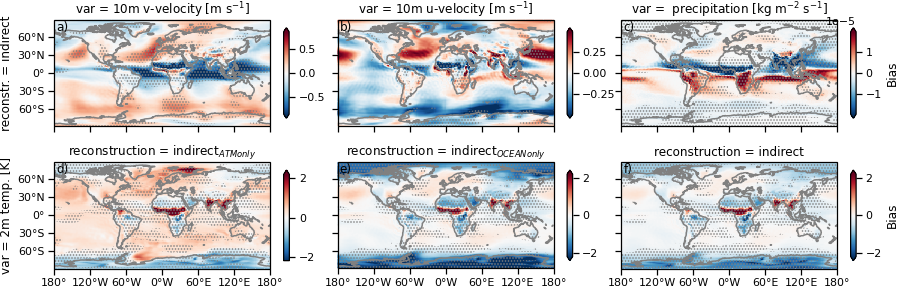

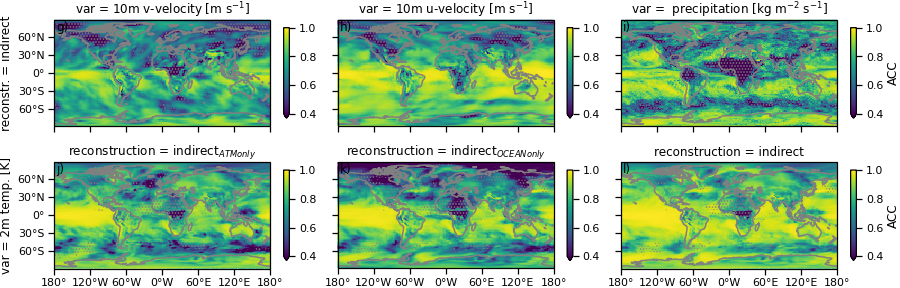

In [74]:
metrics = ["bias", "pearson_r"]
for i, metric in enumerate(metrics):
    plot_fig1_2(tp, metric=metric, shift=i * 6)
merge_fig_1_2(metrics=metrics, new_name="atm_physics")

In [59]:
dszym_debiased = debias(dszym, cut=CUT, how=how_debias)
%time tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()

distributed.comm.inproc - WARNING - Closing dangling queue in <InProc  local=inproc://10.50.42.39/61693/1 remote=inproc://10.50.42.39/61693/95>


CPU times: user 2min 51s, sys: 36.7 s, total: 3min 27s
Wall time: 2min 20s


In [60]:
tp_debiased["temp2"].attrs["long_name"] = (
    tp["temp2"].attrs["long_name"].replace("temperature", "temp.")
)

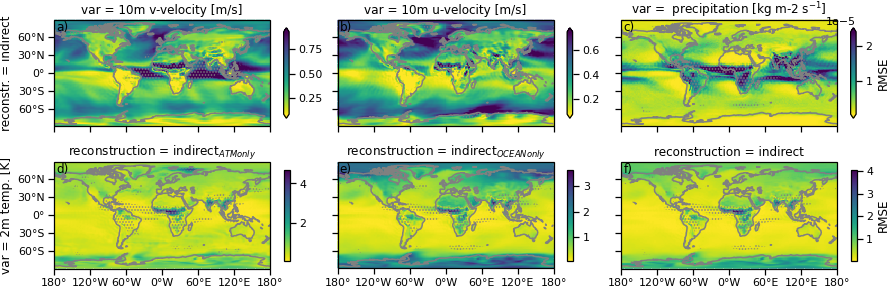

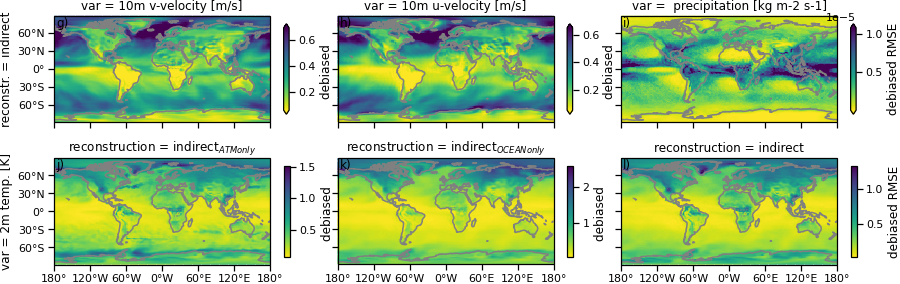

In [64]:
metrics = ["rmse", "debiased_rmse"]
for i, metric in enumerate(metrics):
    fg = plot_fig1_2(
        tp_debiased if "debias" in metric else tp,
        metric=metric.replace("debiased_", ""),
        shift=i * 6,
        debiased=True if "debias" in metric else False,
    )
    if metric == "rmse":
        os.rename("map_rmse_contour.png", "map_rmse_raw_contour.png")
merge_fig_1_2(metrics=metrics, new_name="atm_physics", rm=True)

In [65]:
from subprocess import call

f = ["map_rmse_contour.png", "map_rmse_raw_contour.png"]
to_call = ["convert"] + f + ["-append", "map_rmse_raw_debiased_contour.png"]
print("call", to_call)
call(to_call)

call ['convert', 'map_rmse_contour.png', 'map_rmse_raw_contour.png', '-append', 'map_rmse_raw_debiased_contour.png']


0

###### for context

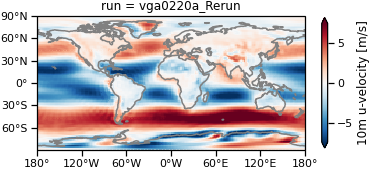

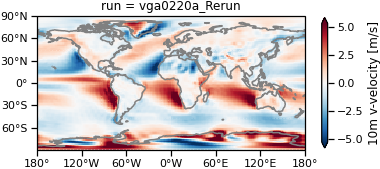

In [43]:
mean.u10.plot_map()
plt.show()
mean.v10.plot_map()

In [ ]:
# Fig.1

In [ ]:
metrics=['bias','pearson_r']
for i,metric in enumerate(metrics):
    plot_fig1_2(tp,metric=metric,shift=i*6)
merge_fig_1_2(metrics=metrics,new_name='atm_physics')

##### old

##### bias
ATM nuding brings regional mean bias

'map_bias_atm_physics_contour_std.png'

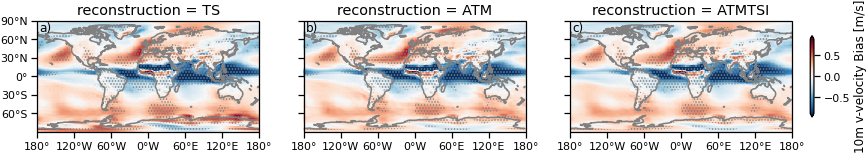

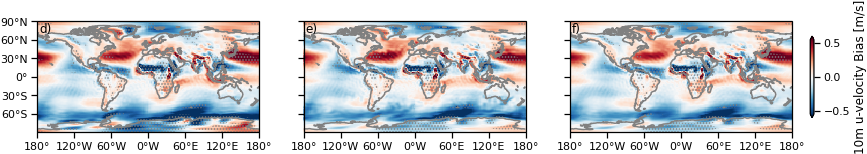

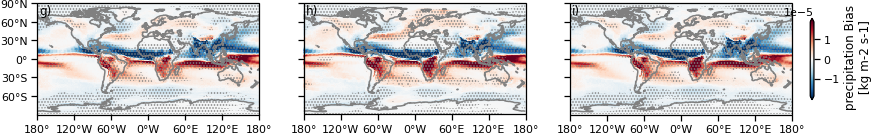

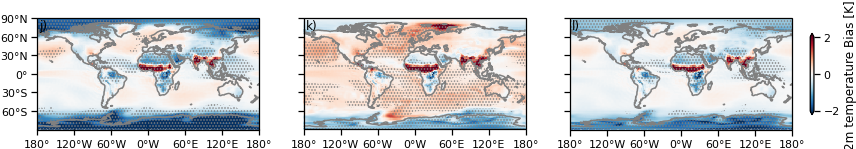

In [44]:
fg = tp.sel(metric="bias").map(plot_map_contour)
merge(metric="bias", new_name=new_name, contour="std")

##### ACC

'map_pearson_r_atm_physics_contour_95th.png'

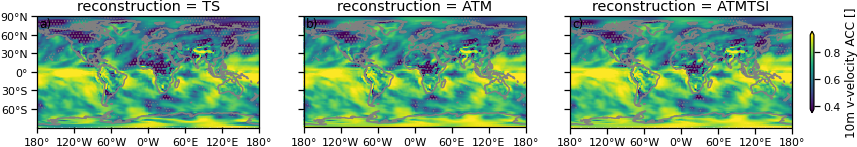

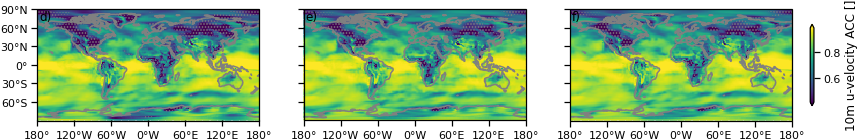

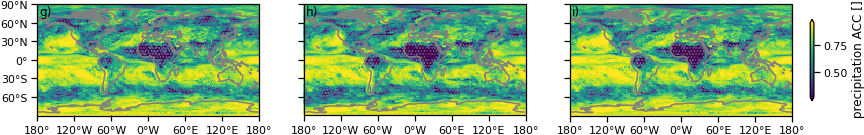

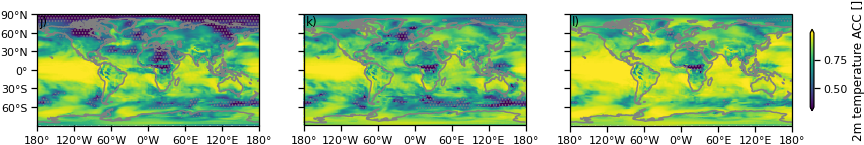

In [45]:
metric = "pearson_r"
_ = tp.sel(metric=metric).map(plot_map_contour)
merge(metric=metric, new_name=new_name, contour="95th")

##### rmse

'map_rmse_atm_physics_contour_5th.png'

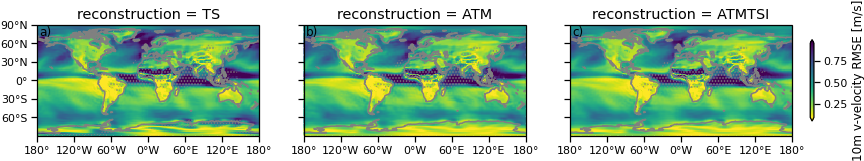

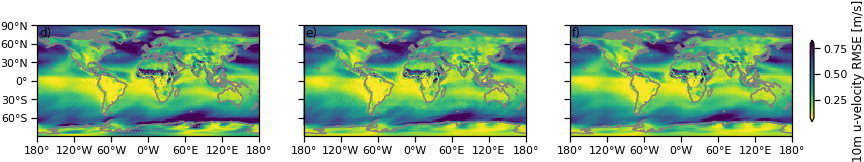

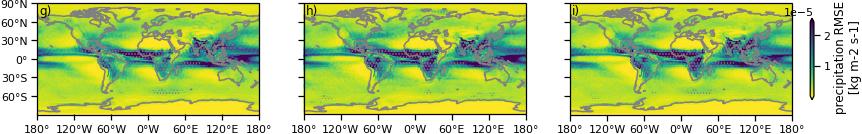

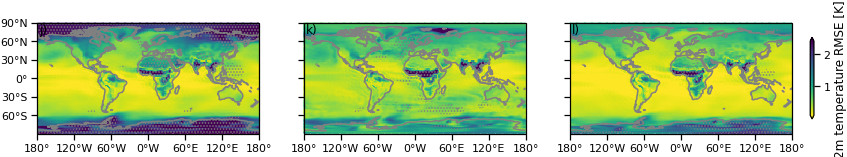

In [46]:
metric = "rmse"
_ = tp.sel(metric=metric).map(plot_map_contour)
merge(metric=metric, new_name=new_name, contour="5th")

- without mean bias reduction:
    - `ATM` nudging leads to local biases
- with mean bias reduction:
    - `ATM` nudging tracks variations well

##### debiased rmse

In [ ]:
dszym_debiased = debias(dszym, cut=CUT, how=how_debias)
%time tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()

_ = tp_debiased.sel(metric="rmse").map(plot_map_contour, feature=None)
merge(metric="debiased_rmse", new_name=new_name, contour="5th")

## carbon (Spring 2021 Fig. 2 & 3)

In [119]:
new_name = "carbon"
feature = None

In [120]:
varlist_carbon = ["spco2", "co2_flx_ocean", "cVeg", "co2_flx_land", "CO2"]
no_ocean_carbon_vars = 1

In [121]:
indirect_runs_carbon = ["ATM", indirect_run, direct_run, c]
indirect_runs_carbon_labels = ["ATM", "indirect", "direct", c]

In [122]:
dsz = xr.open_zarr(ocean_zarr)[varlist_carbon[:no_ocean_carbon_vars]]
dsz = clean(convert_C(dsz)).sel(run=indirect_runs_carbon)
dszymo = yearmean(dsz).chunk({"time": -1})

converted spco2 from Pa to ppm


In [123]:
dsz = xr.open_zarr(atm_zarr)[varlist_carbon[no_ocean_carbon_vars:]]
dsz = clean(convert_C(dsz)).sel(run=indirect_runs_carbon)
dszyml = yearmean(dsz).chunk({"time": -1})

converted CO2 from kg kg-1 to ppm
converted co2_flx_ocean from CO2 units to C units.
converted co2_flx_land from CO2 units to C units.


In [124]:
dszym = xr.merge([dszyml, dszymo]).persist()
dszym["run"] = indirect_runs_carbon_labels

In [125]:
for v in long_name_rename_dict.keys():
    if v in dszym.data_vars:
        dszym[v].attrs["long_name"] = long_name_rename_dict[v]

In [126]:
dszym = dszym[varlist_carbon[::-1]]

In [127]:
latitude = dszymo.rename({"lat": "latitude"}).coords["latitude"]
longitude = dszymo.rename({"lon": "longitude"}).coords["longitude"]
lat = dszyml.coords["lat"]
lon = dszyml.coords["lon"]

dszym.coords["latitude"] = latitude
dszym.coords["longitude"] = longitude
dszym.coords["lat"] = lat
dszym.coords["lon"] = lon


def set_lon_lat(dszym):
    dszym.coords["lat"] = lat
    dszym.coords["lon"] = lon
    return dszym


def set_longitude_latitude(dszym):
    dszym.coords["latitude"] = latitude
    dszym.coords["longitude"] = longitude
    return dszym

### ym tracking performance maps

In [128]:
dszym["run"] = [run_shortname["ATM"]] + list(dszym["run"][1:].values)

In [129]:
mean = dszym.sel(run=c).mean("time").compute()
std = dszym.sel(run=c).std("time").compute()

In [130]:
tp = dszym.map(metrics_over_time, metrics=run_metrics).mean("time").compute()

In [131]:
rt_pearson_r = (
    resample_target_metrics(dszymo, metrics=["pearson_r"], iterations=iterations)
    .sel(metric="pearson_r")
    .chunk({"iteration": -1})
    .quantile(q_high, "iteration", skipna=True)
    .compute()
)
rt_pearson_r = rt_pearson_r.update(
    resample_target_metrics(dszyml, metrics=["pearson_r"], iterations=iterations)
    .sel(metric="pearson_r")
    .chunk({"iteration": -1})
    .quantile(q_high, "iteration", skipna=True)
    .compute()
)

In [132]:
rt_rmse = (
    resample_target_metrics(dszymo, metrics=["rmse"], iterations=iterations)
    .sel(metric="rmse")
    .chunk({"iteration": -1})
    .quantile(q_low, "iteration", skipna=True)
    .compute()
)
rt_rmse = rt_rmse.update(
    resample_target_metrics(dszyml, metrics=["rmse"], iterations=iterations)
    .sel(metric="rmse")
    .chunk({"iteration": -1})
    .quantile(q_low, "iteration", skipna=True)
    .compute()
)

In [133]:
%%time
rt_mae = resample_target_metrics(dszymo, metrics=['mae'],iterations=iterations).sel(metric='mae').chunk({'iteration':-1}).quantile(q_low,'iteration', skipna=True).compute()
rt_mae = rt_mae.update(resample_target_metrics(dszyml, metrics=['mae'],iterations=iterations).sel(metric='mae').chunk({'iteration':-1}).quantile(q_low,'iteration', skipna=True).compute())

CPU times: user 51.8 s, sys: 9.78 s, total: 1min 1s
Wall time: 43 s


#### bias
ATM nuding brings regional mean bias

'map_bias_carbon_contour_std.png'

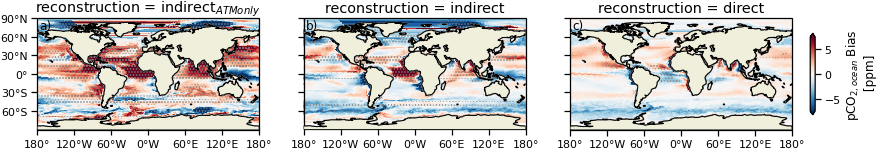

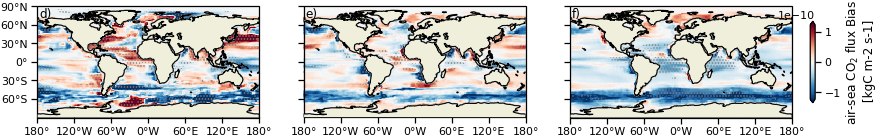

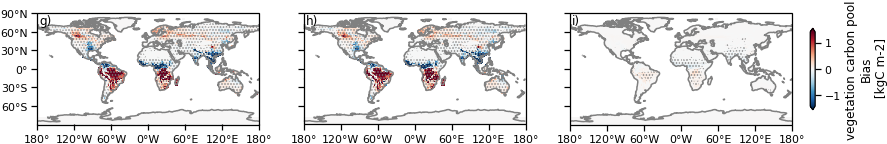

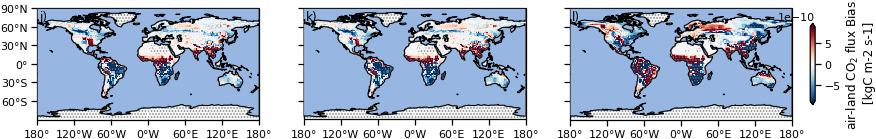

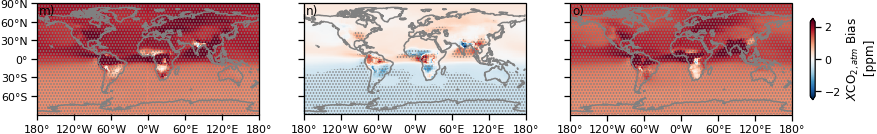

In [134]:
fg = (
    set_longitude_latitude(tp[varlist_carbon[:no_ocean_carbon_vars]])
    .sel(metric="bias")
    .map(plot_map_contour)
)
fg = (
    set_lon_lat(tp[varlist_carbon[no_ocean_carbon_vars:]])
    .sel(metric="bias")
    .map(plot_map_contour)
)
merge(metric="bias", new_name=new_name, contour="std")

#### ACC

'map_pearson_r_carbon_contour_95th.png'

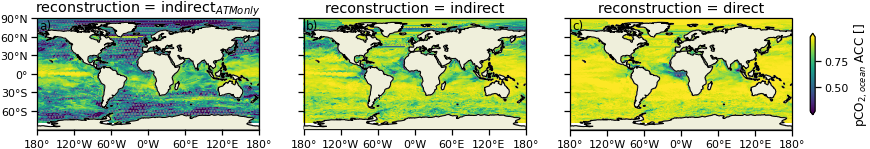

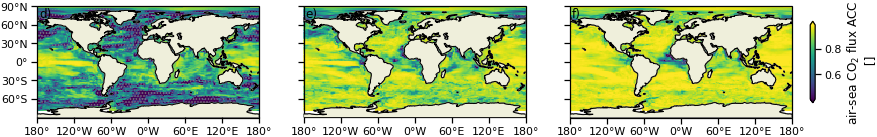

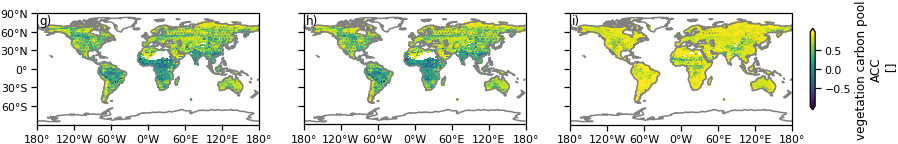

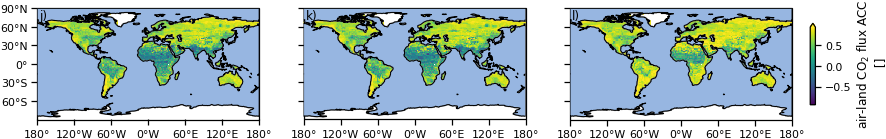

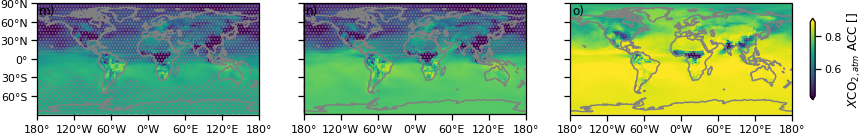

In [135]:
metric = "pearson_r"
_ = (
    set_longitude_latitude(tp[varlist_carbon[:no_ocean_carbon_vars]])
    .sel(metric=metric)
    .map(plot_map_contour)
)
_ = (
    set_lon_lat(tp[varlist_carbon[no_ocean_carbon_vars:]])
    .sel(metric=metric)
    .map(plot_map_contour)
)
merge(metric=metric, new_name=new_name, contour="95th")

#### rmse

'map_rmse_carbon_contour_5th.png'

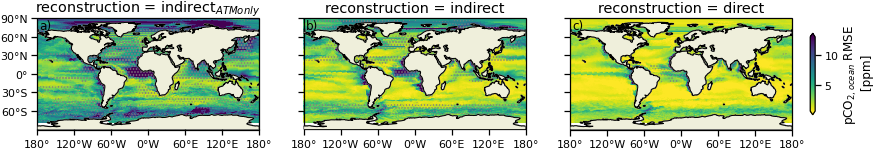

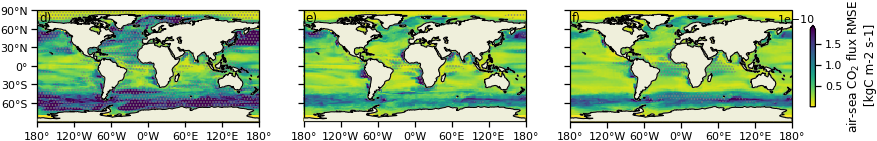

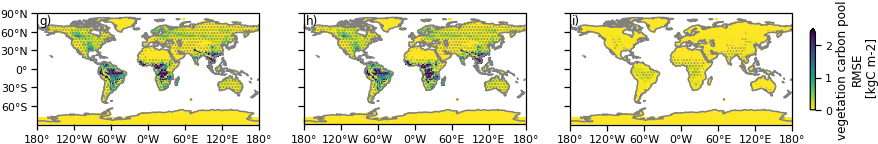

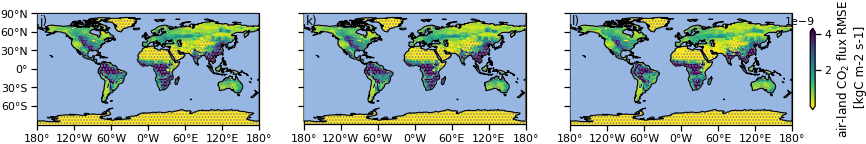

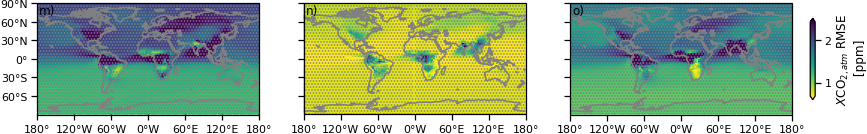

In [136]:
metric = "rmse"
_ = (
    set_longitude_latitude(tp[varlist_carbon[:no_ocean_carbon_vars]])
    .sel(metric=metric)
    .map(plot_map_contour, feature="land")
)
_ = (
    set_lon_lat(tp[varlist_carbon[no_ocean_carbon_vars:]])
    .sel(metric=metric)
    .map(plot_map_contour, feature=feature)
)
merge(metric=metric, new_name=new_name, contour="5th")

#### unbiased rmse

In [137]:
cut = CUT
dszym_debiased = debias(dszym, cut=CUT, how=how_debias)
# tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()
tp_debiased = (
    dszym_debiased.map(metrics_over_time, metrics=run_metrics).mean("time").compute()
)

'map_debiased_rmse_carbon_contour_5th.png'

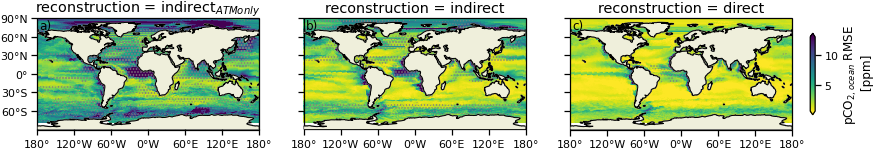

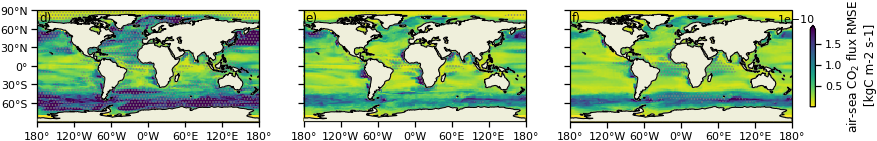

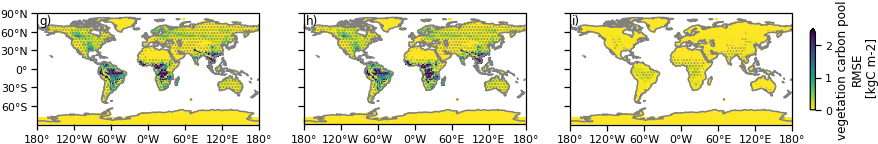

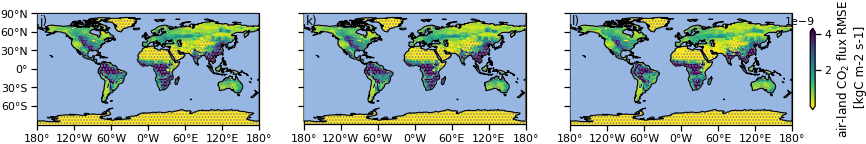

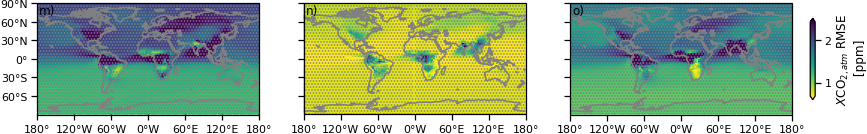

In [138]:
# _ = tp.sel(metric=metric).map(plot_map_contour, feature=feature)
_ = (
    set_longitude_latitude(tp[varlist_carbon[:no_ocean_carbon_vars]])
    .sel(metric=metric)
    .map(plot_map_contour, feature="land")
)
_ = (
    set_lon_lat(tp[varlist_carbon[no_ocean_carbon_vars:]])
    .sel(metric=metric)
    .map(plot_map_contour, feature=feature)
)
merge(metric="debiased_rmse", new_name=new_name, contour="5th")

## global aggregated (Spring 2021 Fig. 5)

direct indirect (manuscript plots)

In [142]:
oceanvarlist_mbgc = ["spco2", "intpp"]
varlist_tbgc = ["co2_flx_ocean", "cVeg", "ws", "box_Cpools_total", "co2_flx_land"]

runs_selected = [c, indirect_run, direct_run]
runs_selected

iterations = 500

In [143]:
# ocean
print(f"get {oceanvarlist_mbgc}")
dsz = xr.open_zarr(ocean_zarr)[oceanvarlist_mbgc]
dsz = clean(convert_C(dsz)).sel(run=runs_selected)

dszr = dsz.map(global_agg, keep_attrs=True).compute()

get ['spco2', 'intpp']
converted spco2 from Pa to ppm


In [144]:
# land
print(f"get {varlist_tbgc}")
dsz = xr.open_zarr(atm_zarr)[varlist_tbgc + ["CO2"]]
dsz = clean(convert_C(dsz)).sel(run=runs_selected)

get ['co2_flx_ocean', 'cVeg', 'ws', 'box_Cpools_total', 'co2_flx_land']
converted CO2 from kg kg-1 to ppm
converted co2_flx_ocean from CO2 units to C units.
converted co2_flx_land from CO2 units to C units.
converted box_Cpools_total from mol(CO2) to kgC


In [145]:
dszr = dszr.update(dsz.map(global_agg, keep_attrs=True, area=land_area).compute())

In [146]:
dszr = dszr.expand_dims("region")
dszr["region"] = ["global"]

In [147]:
dszr = dszr.map(kgC_s_to_PgC_month, keep_attrs=True)

converted Net primary mole productivity of carbon by phytoplankton
converted upward ocean C flux (acc.)
converted total upward land C flux (acc.)


In [148]:
# save output
dszr.to_netcdf("dszr.nc")

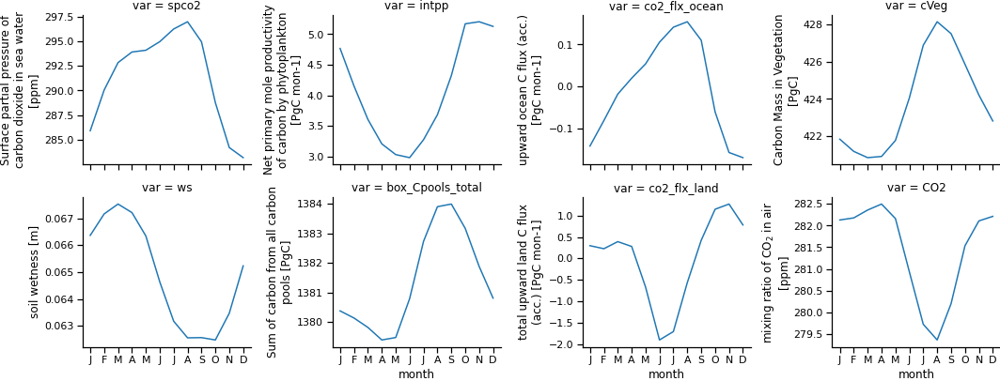

In [166]:
fig, ax = plt.subplots(
    ncols=len(dszr.data_vars) // 2, nrows=2, figsize=(15, 6), sharex=True
)
for i, axes in enumerate(ax.flatten()):
    v = list(dszr.data_vars)[i]
    dszr.sel(run=c).groupby("time.month").mean().squeeze()[v].plot(ax=axes)
    axes.set_title(f"var = {v}")
    axes.set_xticks(np.arange(1, 13))
    axes.set_xticklabels("JFMAMJJASOND")
    if i < 5:
        axes.set_xlabel("")
plt.tight_layout()
sns.despine()
plt.savefig("global_seasonality_carbon.png")

### Fig. 5

In [ ]:
# monthly
show_vars = ["spco2", "co2_flx_ocean", "cVeg", "co2_flx_land", "CO2"]

dszrm = split_into_months(dszr)

tpm = (
    metrics_over_time(dszrm, metrics=run_metrics)
    .squeeze(drop=True)[show_vars]
    .map(add_showname)
    .map(latexify_units)
)

In [172]:
tpm["cVeg"].attrs["showname"] = tpm["cVeg"].attrs["showname"].replace("carbon", "C")

In [173]:
tpm["run"] = ["indirect", "direct"]
tpm["metric"] = ["Bias", "MAE", "ACC", "RMSE"]
rtm = resample_target_metrics(dszrm, metrics=run_metrics, iterations=iterations)[
    show_vars
]
rtm["metric"] = ["Bias", "ACC", "RMSE"]

# debiased
dszrm_debiased = debias(dszrm, how="mean", cut=CUT)
tpm_debiased = metrics_over_time(dszrm_debiased, metrics=run_metrics).squeeze(
    drop=True
)[show_vars]
tpm_debiased["run"] = ["indirect", "direct"]

In [174]:
# annual
dszrym = yearmean(dszr)
tpa = metrics_over_time(dszrym, metrics=run_metrics).squeeze(drop=True)[show_vars]
tpa["run"] = ["indirect", "direct"]
tpa["metric"] = ["Bias", "MAE", "ACC", "RMSE"]
rta = resample_target_metrics(
    dszrym, metrics=run_metrics, iterations=iterations
).squeeze(drop=True)[show_vars]
rta["metric"] = ["Bias", "ACC", "RMSE"]

# annual debiased
dszrym_debiased = debias(dszrym, how=how_debias, cut=CUT)
tpa_debiased = metrics_over_time(dszrym_debiased, metrics=run_metrics)[show_vars]
tpa_debiased["run"] = ["indirect", "direct"]
tpa_debiased["metric"] = ["Bias", "MAE", "ACC", "RMSE"]

In [175]:
# gather df for seaborn catplot
# use mae as bias threshold

df = tpm.to_dataframe()

df = df.unstack(0).unstack(0).unstack(0)

df = df.melt()

df.columns = ["variable", "metric", "month", "reconstruction", "value"]

In [176]:
# add resampled
## annual
resa = xr.concat(
    [
        rta.squeeze(drop=True)
        .sel(metric=["ACC"])
        .quantile(dim="iteration", q=q_high, skipna=True),
        rta.squeeze(drop=True)
        .drop_sel(metric="ACC")
        .quantile(dim="iteration", q=q_low, skipna=True),
    ],
    "metric",
).expand_dims("iteration")
del resa["quantile"]
# monthly
res = xr.concat(
    [
        rtm.squeeze(drop=True)
        .sel(metric=["ACC"])
        .quantile(dim="iteration", q=0.95, skipna=True),
        rtm.squeeze(drop=True)
        .drop_sel(metric="ACC")
        .quantile(dim="iteration", q=0.05, skipna=True),
    ],
    "metric",
).expand_dims("iteration")
del res["quantile"]

df2 = res.to_dataframe().unstack().unstack().melt()
df2["run"] = "resampled"

df2.columns = ["variable", "month", "metric", "value", "reconstruction"]

df = pd.concat([df, df2])

In [177]:
# add perfect
df3 = xr.concat(
    [
        xr.ones_like(rtm.squeeze(drop=True).sel(metric=["ACC"]).isel(iteration=0)),
        xr.zeros_like(rtm.squeeze(drop=True).drop_sel(metric="ACC").isel(iteration=0)),
    ],
    "metric",
).expand_dims("iteration")

del df3["run"]

df3 = df3.to_dataframe().unstack().unstack().melt()
df3["run"] = "perfect"

df3.columns = ["variable", "month", "metric", "value", "reconstruction"]

df = pd.concat([df, df3])

In [ ]:
%%time

sns.set_context("notebook", font_scale=1.2, rc={"lines.linewidth": 1.25})

sns.set_palette(
    sns.color_palette([c_dict["indirect"], c_dict["direct"], c_dict["perfect"],c_dict["perfect"]])
)

g = sns.catplot(
    data=df,
    kind="point",
    sharex=True,
    sharey=False,
    margin_titles=True,
    x="month",
    y="value",
    hue="reconstruction",
    hue_order=["indirect", "direct", "resampled",'perfect'],
    col="metric",
    col_order=["Bias", "ACC", "RMSE"],
    row="variable", row_order=show_vars, #change variables here
    linestyles=["-", "-", "",""], # dont show line for resampled and perfect 
    markers=["o", "o", "o",'*'], # perfect as star
    scale=.8,
    legend_out=True,
    dodge=0.1,
    capsize=0.1,
    #n_boot=10,ci=.96, # bootstrapping in seaborn # dont use
    ci="sd", # take standard deviation, no bootstrapping in seaborn
    height=2.9,
    aspect=2,  # change figsize
)
an_lw=2
an_marker='x'
for i, axis in enumerate(g.axes):
    for j, ax in enumerate(axis):
        m = g.axes[0][j].get_title().replace('metric = ','')
        v = g.axes[i][-1].texts[0].get_text().replace('variable = ','')
        #print(m,v)
        ## add annual
        # skill
        for k,run in enumerate(tpa.run.values):
            run=str(run)
            an = tpa.sel(metric=m,run=run,drop=True)[v]
            ax.errorbar(
                6.5-1+k*0.1-0.05,
                an.mean('time'),
                yerr=[[an.std('time')], [an.std('time')]],
                c=c_dict[run],
                lw=an_lw,
                marker=an_marker,
                capsize=2,
                capthick=an_lw,
                elinewidth=an_lw,
                label='annual'
            )
        # resampled
        an = resa.sel(metric=m,drop=True)[v]
        ax.scatter(
            6.5-1,
            an,
            c=c_dict['perfect'],
            lw=an_lw,
            marker=an_marker,
        )
        #if m=='Bias' and v=='spco2':
        #    ax.legend()
        if m == 'Bias':
            # add negative resampled boundary
            ax.scatter(res.month-1,(res.sel(metric='Bias')[v].squeeze()*-1),c=c_dict['perfect'],marker='o',s=20)
            ax.scatter(
                6.5-1,
                an*-1,
                c=c_dict['perfect'],
                lw=an_lw,
                marker=an_marker,
            )
        if m == 'RMSE':
            # set margin_titles with units
            plt.setp(ax.texts, text=f'{tpm[v].attrs["showname"]} [{tpm[v].attrs["units"]}]')
        if m =='ACC':
            # set all ACC axis y to min,max
            ax.set_ylim([0,1.02])

        if m == 'RMSE':
            # add debiased
            for k,run in enumerate(tpm_debiased.run.values):
                run=str(run)
                db = tpm_debiased.sel(metric='rmse',run=run,drop=True)[v]
                ax.errorbar(
                    db.month+k*0.2-0.1,
                    db.mean('time'),
                    yerr=[db.std('time'), db.std('time')],
                    c=c_dict[run],
                    capsize=2,
                )
            # annual
            for k,run in enumerate(tpa_debiased.run.values):
                run=str(run)
                an = tpa_debiased.sel(metric=m,run=run,drop=True)[v]
                ax.errorbar(
                    6.5-1+k*0.1-0.05,
                    an.mean('time'),
                    #yerr=[[an.std('time')], [an.std('time')]],
                    yerr=an.std('time'),
                    c=c_dict[run],
                    lw=an_lw,
                    marker=an_marker,
                    markersize=8,
                    capsize=2,
                    capthick=an_lw,
                    elinewidth=an_lw,
                    label='annual'
                )
            

g.axes[0][2].set_title('metric = RMSE (debiased thin)')
g.axes[0][1].set_title('metric = ACC [ ]')

# delete value
g.set_ylabels("")

# rename xlabels
#g.set_xticklabels("JFMAMJJASOND")
g.set_xticklabels(["Jan",'Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov',"Dec"])

# add annotations
kw = dict(
            xycoords="figure fraction", va="center", rotation=270, fontsize="x-large"
        )
plt.annotate("ocean carbon", (0.9, 0.82),**kw)
plt.annotate("land carbon", (0.9, 0.39),**kw)
plt.annotate("atmosphere", (0.9, 0.12),**kw)
# add labels like a)
add_figurelabels(g.axes, pad=0.8, labels="abcdefghijklmnopqrstuvwxyz")
g.fig.subplots_adjust(wspace=0.2, hspace=0.2)
plt.savefig(
    "metrics_month_in_direct_carbon_region_global.png",
    transparent=True,
    bbox_inches="tight",
    pad_inches=0,
)

# SI

## redo fig 5 for sensitivity experiments

In [71]:
oceanvarlist_mbgc = ["spco2"]
varlist_tbgc = ["co2_flx_ocean", "cVeg", "co2_flx_land"]

runs_selected = [
    c,
    indirect_run,
    "ATMTSIDICALKlandr",
    "ATMTSIDICALKland2",
    "ATMTSIDICALKlandR",
    "ATMTSIrhamocc",
]

iterations = 500

In [72]:
# ocean
print(f"get {oceanvarlist_mbgc}")
dsz = xr.open_zarr(ocean_zarr)[oceanvarlist_mbgc]
dsz = clean(convert_C(dsz)).sel(run=runs_selected)

dszr = dsz.map(global_agg, keep_attrs=True).compute()

get ['spco2']
converted spco2 from Pa to ppm


In [73]:
# land
print(f"get {varlist_tbgc}")
dsz = xr.open_zarr(atm_zarr)[varlist_tbgc + ["CO2"]]
dsz = clean(convert_C(dsz)).sel(run=runs_selected)

get ['co2_flx_ocean', 'cVeg', 'co2_flx_land']
converted CO2 from kg kg-1 to ppm
converted co2_flx_ocean from CO2 units to C units.
converted co2_flx_land from CO2 units to C units.


In [74]:
dszr = dszr.update(dsz.map(global_agg, keep_attrs=True, area=land_area).compute())

In [75]:
dszr = dszr.expand_dims("region")
dszr["region"] = ["global"]

In [76]:
dszr = dszr.map(kgC_s_to_PgC_month, keep_attrs=True)

converted upward ocean C flux (acc.)
converted total upward land C flux (acc.)


In [77]:
dszrm = split_into_months(dszr)

tpm = (
    metrics_over_time(dszrm, metrics=run_metrics)
    .squeeze(drop=True)[show_vars]
    .map(add_showname)
    .map(latexify_units)
)

In [99]:
tpm["run"] = ["indirect", "directLR1ON", "directLR2ON", "directLR5ON", "directLxOR1"]

In [100]:
tpm["metric"] = ["Bias", "MAE", "ACC", "RMSE"]

In [206]:
tpm["cVeg"].attrs["showname"] = tpm["cVeg"].attrs["showname"].replace("carbon", "C")

In [207]:
df = tpm.drop_sel(metric="MAE").to_dataframe()

df = df.unstack(0).unstack(0).unstack(0)

df = df.melt()

df.columns = ["variable", "metric", "month", "reconstruction", "value"]

In [216]:
# resampled
rtm = resample_target_metrics(dszrm, metrics=run_metrics, iterations=iterations)[
    show_vars
]
rtm["metric"] = ["Bias", "ACC", "RMSE"]

In [222]:
res = xr.concat(
    [
        rtm.squeeze(drop=True)
        .sel(metric=["ACC"])
        .quantile(dim="iteration", q=0.95, skipna=True),
        rtm.squeeze(drop=True)
        .drop_sel(metric="ACC")
        .quantile(dim="iteration", q=0.05, skipna=True),
    ],
    "metric",
).expand_dims("iteration")
del res["quantile"]

df2 = res.to_dataframe().unstack().unstack().melt()
df2["run"] = "resampled"

df2.columns = ["variable", "month", "metric", "value", "reconstruction"]

df = pd.concat([df, df2])

In [218]:
# debiased
dszrm_debiased = debias(dszrm, how="mean", cut=CUT)
tpm_debiased = metrics_over_time(dszrm_debiased, metrics=run_metrics).squeeze(
    drop=True
)[show_vars]
tpm_debiased["run"] = tpm["run"]

In [212]:
# add perfect
dfperfect = df.copy()

dfperfect["value"] = dfperfect["value"] - dfperfect["value"]

dfperfect[dfperfect.metric == "ACC"]["value"] = 1

dfperfect = pd.concat(
    [
        dfperfect.where(dfperfect.metric == "ACC").replace(0, 1).dropna(),
        dfperfect.where(dfperfect.metric != "ACC").dropna(),
    ]
)

dfperfect["reconstruction"] = "perfect"
dfperfect = dfperfect[~dfperfect.duplicated()]
df = pd.concat([df, dfperfect])

In [ ]:
%%time

sns.set_context("notebook", font_scale=1.2, rc={"lines.linewidth": 1.25})

sns.set_palette(
    sns.color_palette([c_dict["indirect"], c_dict["direct"],c_dict["direct"],c_dict["direct"],'royalblue',c_dict["perfect"]])
)

g = sns.catplot(
    data=df,
    kind="point",
    sharex=True,
    sharey=False,
    margin_titles=True,
    x="month",
    y="value",
    hue="reconstruction",
    hue_order=list(tpm.run.values)+['perfect'],
    col="metric",
    col_order=["Bias", "ACC", "RMSE"],
    row="variable", row_order=show_vars, #change variables here
    linestyles=["-", "-", "--","-.",'-',''], # dont show line for resampled and perfect 
    markers=["o", "o", "^",'v','o','*'], # perfect as star
    scale=.8,
    legend_out=True,
    dodge=0.1,
    capsize=0.1,
    #n_boot=10,ci=.96, # bootstrapping in seaborn # dont use
    ci="sd", # take standard deviation, no bootstrapping in seaborn
    height=2.9,
    aspect=2,  # change figsize
)
an_lw=2
an_marker='x'
annual=False
for i, axis in enumerate(g.axes):
    for j, ax in enumerate(axis):
        m = g.axes[0][j].get_title().replace('metric = ','')
        v = g.axes[i][-1].texts[0].get_text().replace('variable = ','')
        #print(m,v)
        if annual:
            ## add annual
            # skill
            for k,run in enumerate(tpa.run.values):
                run=str(run)
                an = tpa.sel(metric=m,run=run,drop=True)[v]
                ax.errorbar(
                    6.5-1+k*0.1-0.05,
                    an.mean('time'),
                    yerr=[[an.std('time')], [an.std('time')]],
                    c=c_dict[run],
                    lw=an_lw,
                    marker=an_marker,
                    capsize=2,
                    capthick=an_lw,
                    elinewidth=an_lw,
                    label='annual'
                )
            # resampled
            an = resa.sel(metric=m,drop=True)[v]
            ax.scatter(
                6.5-1,
                an,
                c=c_dict['perfect'],
                lw=an_lw,
                marker=an_marker,
            )
        if m == 'Bias':
            # add negative resampled boundary
            ax.scatter(res.month-1,(res.sel(metric='Bias')[v].squeeze()*-1),c=c_dict['perfect'],marker='o',s=20)
            if annual:
                    ax.scatter(
                    6.5-1,
                    an*-1,
                    c=c_dict['perfect'],
                    lw=an_lw,
                    marker=an_marker,
                )
        if m == 'RMSE':
            # set margin_titles with units
            plt.setp(ax.texts, text=f'{tpm[v].attrs["showname"]} [{tpm[v].attrs["units"]}]')
        if m =='ACC':
            # set all ACC axis y to min,max
            ax.set_ylim([0,1.02])

        if m == 'RMSE':
            # add debiased
            for k,run in enumerate(tpm_debiased.run.values):
                run=str(run)
                db = tpm_debiased.sel(metric='rmse',run=run,drop=True)[v]
                ax.errorbar(
                    db.month+k*0.2-0.1,
                    db.mean('time'),
                    yerr=[db.std('time'), db.std('time')],
                    c=c_dict[run],
                    capsize=2,
                )
            # annual
            if annual:
                for k,run in enumerate(tpa_debiased.run.values):
                    run=str(run)
                    an = tpa_debiased.sel(metric=m,run=run,drop=True)[v]
                    ax.errorbar(
                        6.5-1+k*0.1-0.05,
                        an.mean('time'),
                        #yerr=[[an.std('time')], [an.std('time')]],
                        yerr=an.std('time'),
                        c=c_dict[run],
                        lw=an_lw,
                        marker=an_marker,
                        markersize=8,
                        capsize=2,
                        capthick=an_lw,
                        elinewidth=an_lw,
                        label='annual'
                    )
            

g.axes[0][2].set_title('metric = RMSE (debiased thin)')
g.axes[0][1].set_title('metric = ACC [ ]')

# delete value
g.set_ylabels("")

# rename xlabels
#g.set_xticklabels("JFMAMJJASOND")
g.set_xticklabels(["Jan",'Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov',"Dec"])

# add annotations
kw = dict(
            xycoords="figure fraction", va="center", rotation=270, fontsize="x-large"
        )
plt.annotate("ocean carbon", (0.9, 0.82),**kw)
plt.annotate("land carbon", (0.9, 0.39),**kw)
plt.annotate("atmosphere", (0.9, 0.12),**kw)
# add labels like a)
add_figurelabels(g.axes, pad=0.8, labels="abcdefghijklmnopqrstuvwxyz")
g.fig.subplots_adjust(wspace=0.2, hspace=0.2)
plt.savefig(
    "metrics_month_in_direct_carbon_region_global_sensitivity.png",
    transparent=True,
    bbox_inches="tight",
    pad_inches=0,
)

# FINISH

In [27]:
client.close()

CPU times: user 27.6 s, sys: 5.45 s, total: 33.1 s
Wall time: 28.6 s


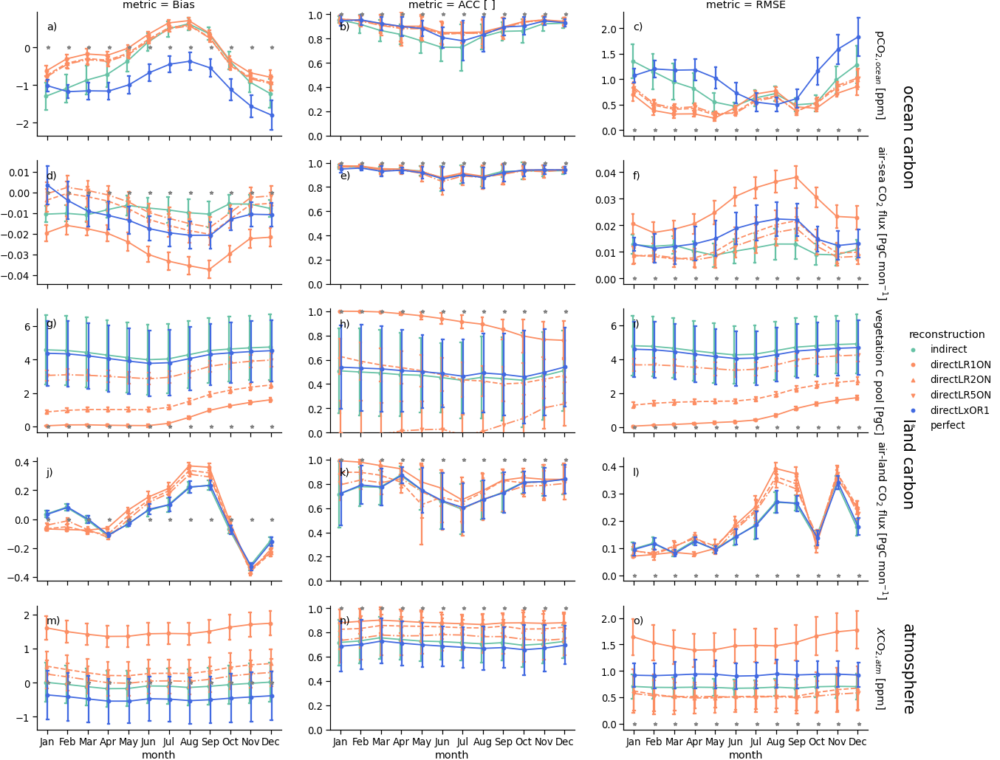

In [214]:
%%time

sns.set_context("notebook", font_scale=1.2, rc={"lines.linewidth": 1.25})

sns.set_palette(
    sns.color_palette([c_dict["indirect"], c_dict["direct"],c_dict["direct"],c_dict["direct"],'royalblue',c_dict["perfect"]])
)

g = sns.catplot(
    data=df,
    kind="point",
    sharex=True,
    sharey=False,
    margin_titles=True,
    x="month",
    y="value",
    hue="reconstruction",
    hue_order=list(tpm.run.values)+['perfect'],
    col="metric",
    col_order=["Bias", "ACC", "RMSE"],
    row="variable", row_order=show_vars, #change variables here
    linestyles=["-", "-", "--","-.",'-',''], # dont show line for resampled and perfect 
    markers=["o", "o", "^",'v','o','*'], # perfect as star
    scale=.8,
    legend_out=True,
    dodge=0.1,
    capsize=0.1,
    #n_boot=10,ci=.96, # bootstrapping in seaborn # dont use
    ci="sd", # take standard deviation, no bootstrapping in seaborn
    height=2.9,
    aspect=2,  # change figsize
)
for i, axis in enumerate(g.axes):
    for j, ax in enumerate(axis):
        m = g.axes[0][j].get_title().replace('metric = ','')
        v = g.axes[i][-1].texts[0].get_text().replace('variable = ','')

        if m == 'RMSE':
            # set margin_titles with units
            plt.setp(ax.texts, text=f'{tpm[v].attrs["showname"]} [{tpm[v].attrs["units"]}]')
        if m =='ACC':
            # set all ACC axis y to min,max
            ax.set_ylim([0,1.02])

            

g.axes[0][2].set_title('metric = RMSE')
g.axes[0][1].set_title('metric = ACC [ ]')

# delete value
g.set_ylabels("")

# rename xlabels
#g.set_xticklabels("JFMAMJJASOND")
g.set_xticklabels(["Jan",'Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov',"Dec"])

# add annotations
kw = dict(
            xycoords="figure fraction", va="center", rotation=270, fontsize="x-large"
        )
plt.annotate("ocean carbon", (0.9, 0.82),**kw)
plt.annotate("land carbon", (0.9, 0.39),**kw)
plt.annotate("atmosphere", (0.9, 0.12),**kw)
# add labels like a)
add_figurelabels(g.axes, pad=0.8, labels="abcdefghijklmnopqrstuvwxyz")
g.fig.subplots_adjust(wspace=0.2, hspace=0.2)
plt.savefig(
    "metrics_month_in_direct_carbon_region_global_sensitivity.png",
    transparent=True,
    bbox_inches="tight",
    pad_inches=0,
)

# misc

converted CO2 from kg kg-1 to ppm


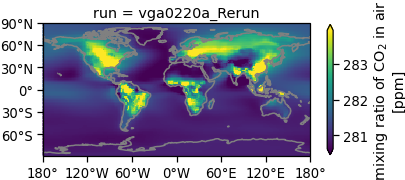

In [138]:
# mean state CO2
convert_C(xr.open_zarr(atm_zarr)["CO2"].sel(run=c).mean("time")).plot_map()

# correlation of bias

In [83]:
corr_atmvarlist_physics = [
    "temp2",
    "precip",
    "u10",
    "v10",
    "cVeg",
    "co2_flx_land",
    "nep",
    "nbp",
    "npp",
    "gpp",
    "rh",
]

In [84]:
dsz = xr.open_zarr(atm_zarr)[corr_atmvarlist_physics]
dsz = clean(convert_C(dsz)).sel(run=indirect_runs + [direct_run])

converted co2_flx_land from CO2 units to C units.


In [85]:
dszym = yearmean(dsz).chunk({"time": -1})

In [86]:
tp = metrics_over_time(dszym, metrics=run_metrics).chunk({"time": -1}).persist()

In [131]:
def plot_corr(v1, v2, metric="bias"):
    tp.sel(metric=metric).xs.pearson_r(v1, v2, "time").plot_map(
        col="run",
        robust=True,
        figsize=(18, 4),
        levels=np.linspace(-1, 1, 9),
        feature="ocean",
    )

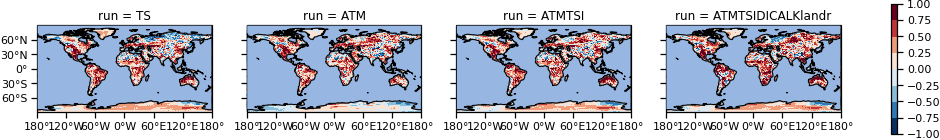

In [132]:
plot_corr("temp2", "co2_flx_land")

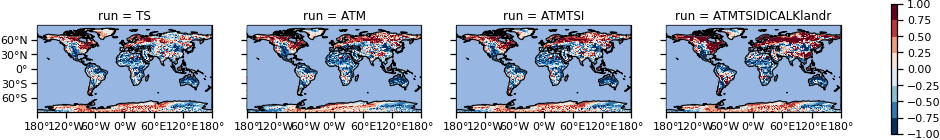

In [133]:
plot_corr("precip", "co2_flx_land")

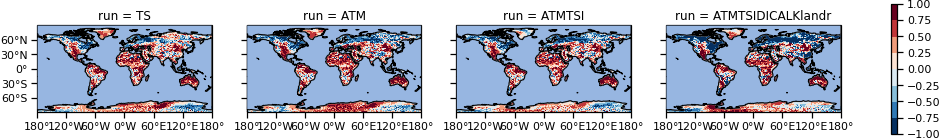

In [134]:
plot_corr("precip", "nbp")

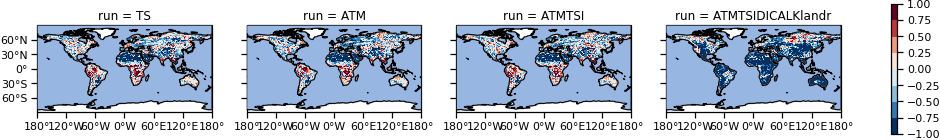

In [135]:
plot_corr("cVeg", "co2_flx_land")

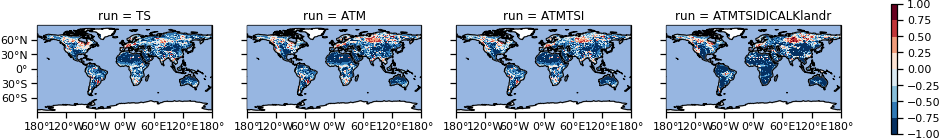

In [136]:
plot_corr("gpp", "co2_flx_land")

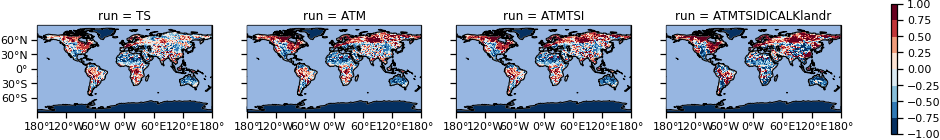

In [137]:
plot_corr("rh", "co2_flx_land")

# SI TBGC

In [42]:
new_name = "tbgc"

In [43]:
tbgcvarlist = [
    "temp2",
    "precip",
    "ws",
    "lai",
    "box_Cpools_total",
    "co2_flx_land",
]

In [44]:
dsz = xr.open_zarr(atm_zarr)[tbgcvarlist]
dsz = clean(convert_C(dsz)).sel(run=indirect_runs_carbon)
dszym = yearmean(dsz).chunk({"time": -1}).persist()

converted co2_flx_land from CO2 units to C units.
converted box_Cpools_total from mol(CO2) to kgC


In [45]:
# dszym = dszym[list(dszym.data_vars)[::-1]]

In [46]:
dszym["run"] = indirect_runs_carbon_labels

In [47]:
for v in long_name_rename_dict.keys():
    if v in dszym.data_vars:
        dszym[v].attrs["long_name"] = long_name_rename_dict[v]

#### ym tracking performance maps

In [48]:
mean = dszym.sel(run=c).mean("time").compute()
std = dszym.sel(run=c).std("time").compute()

tp = metrics_over_time(dszym, metrics=run_metrics).mean("time").compute()

In [51]:
rt_pearson_r = (
    resample_target_metrics(dszym, metrics=run_metrics, iterations=iterations)
    .sel(metric="pearson_r")
    .chunk({"iteration": -1})
    .quantile(q_high, "iteration", skipna=True)
    .compute()
)
rt_rmse = (
    resample_target_metrics(dszym, metrics=run_metrics, iterations=iterations)
    .sel(metric="rmse")
    .chunk({"iteration": -1})
    .quantile(q_high, "iteration", skipna=True)
    .compute()
)

In [49]:
rt_mae = (
    resample_target_metrics(dszym, metrics=run_metrics, iterations=iterations)
    .sel(metric="mae")
    .chunk({"iteration": -1})
    .quantile(q_low, "iteration", skipna=True)
    .compute()
)

##### bias
ATM nuding brings regional mean bias

'map_bias_tbgc_contour_std.png'

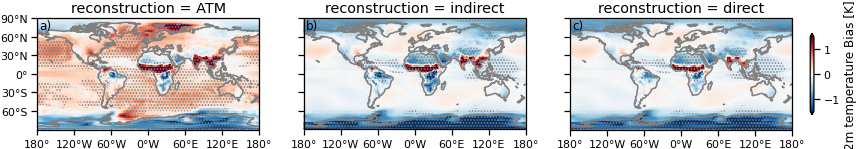

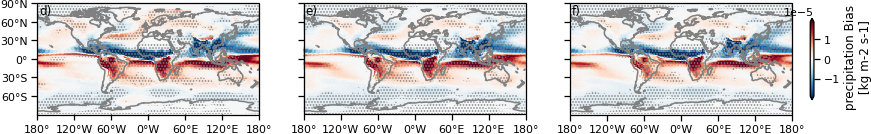

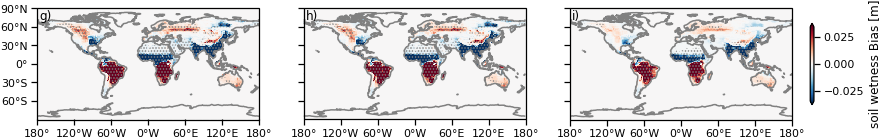

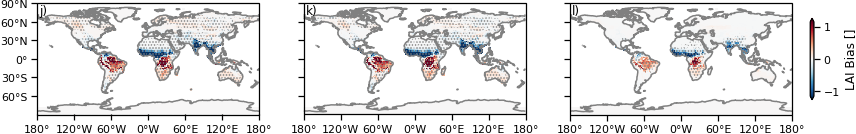

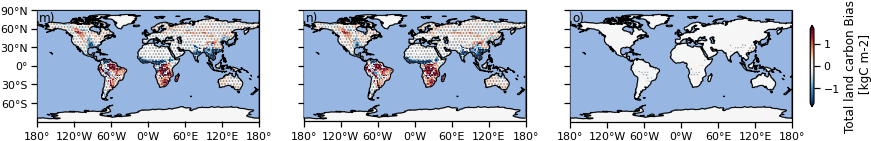

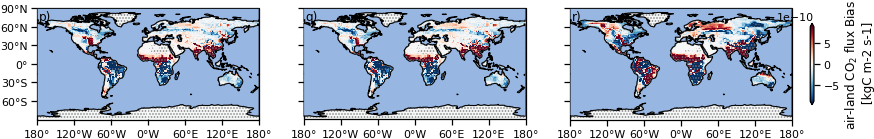

In [50]:
fg = tp.sel(metric="bias").map(plot_map_contour)
merge(metric="bias", new_name=new_name, contour="std")

##### ACC

'map_pearson_r_tbgc_contour_95th.png'

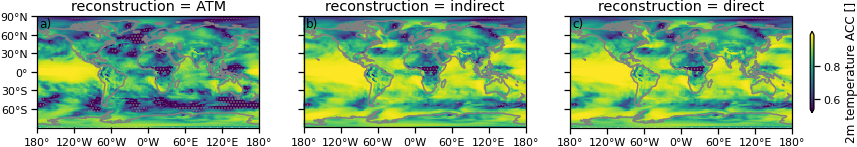

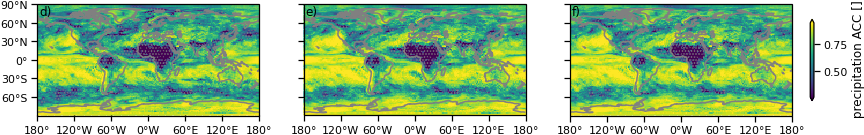

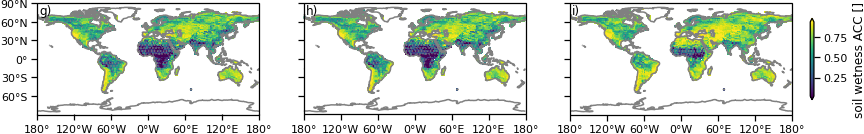

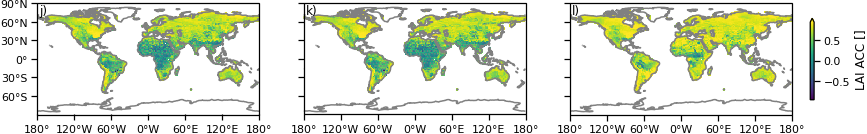

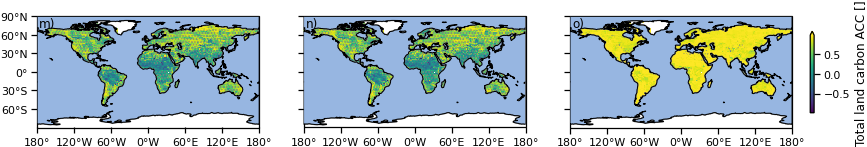

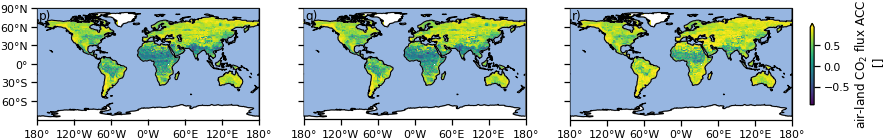

In [52]:
metric = "pearson_r"
_ = tp.sel(metric=metric).map(plot_map_contour)
merge(metric=metric, new_name=new_name, contour="95th")

##### rmse

'map_rmse_tbgc_contour_5th.png'

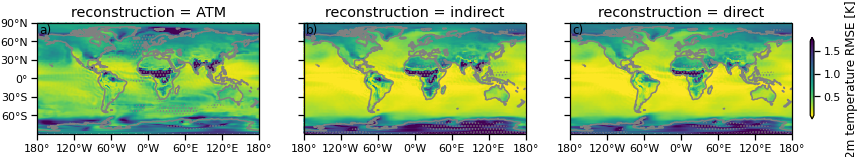

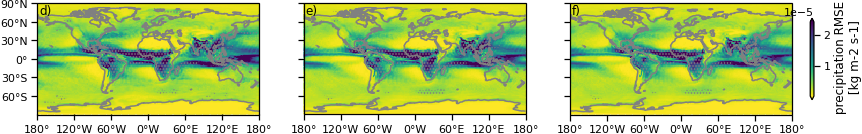

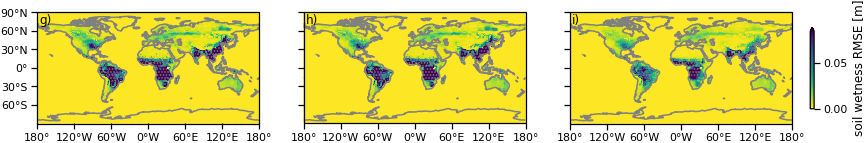

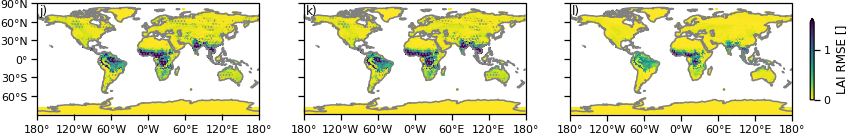

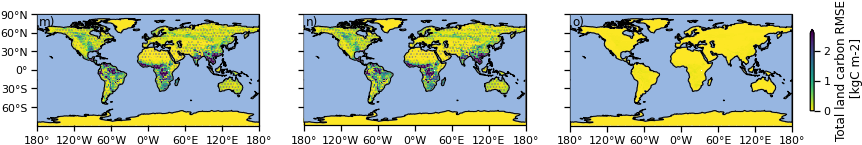

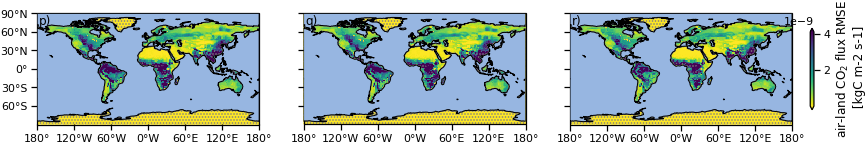

In [53]:
metric = "rmse"
_ = tp.sel(metric=metric).map(plot_map_contour)
merge(metric=metric, new_name=new_name, contour="5th")

##### debiased rmse

In [54]:
dszym_debiased = debias(dszym, cut=CUT, how=how_debias)
%time tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()

distributed.comm.inproc - WARNING - Closing dangling queue in <InProc  local=inproc://10.50.43.138/36414/1 remote=inproc://10.50.43.138/36414/123>
distributed.comm.inproc - WARNING - Closing dangling queue in <InProc  local=inproc://10.50.43.138/36414/21 remote=inproc://10.50.43.138/36414/124>


CPU times: user 5min 32s, sys: 1min 23s, total: 6min 56s
Wall time: 4min 28s


'map_debiased_rmse_tbgc_contour_5th.png'

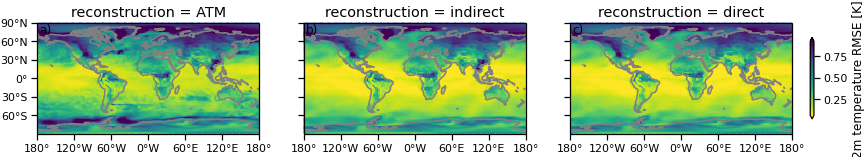

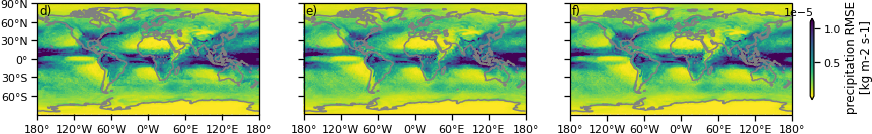

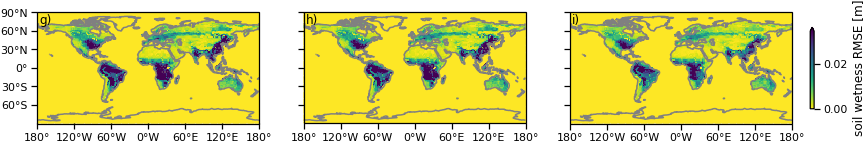

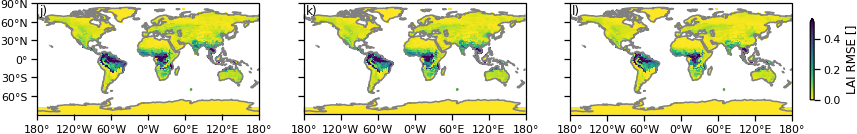

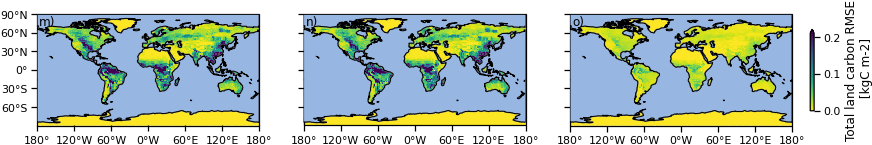

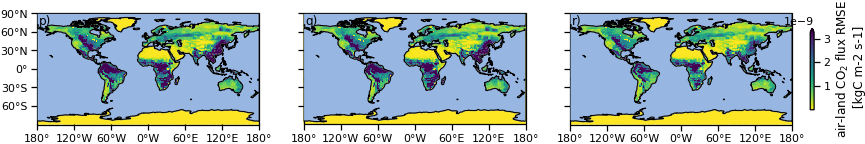

In [55]:
_ = tp_debiased.sel(metric="rmse").map(plot_map_contour, feature=None)
merge(metric="debiased_rmse", new_name=new_name, contour="5th")

##### rmse

In [ ]:
metric="rmse"
_ = tp.sel(metric=metric).map(plot_map_contour, feature='land')
merge(metric=metric,new_name=new_name, contour='5th')

##### debiased rmse

In [ ]:
dszym_debiased = debias(dszym,cut=CUT,how=how_debias)
tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()

In [ ]:
_ = tp_debiased.sel(metric='rmse').map(plot_map_contour, feature='land')
merge(metric='debiased_rmse',new_name=new_name, contour='5th')

## ocean biogeochemistry

In [150]:
oceanvarlist_mbgc = ["spco2",'fgco2']

In [73]:
new_name='mbgc'

In [86]:
dsz = xr.open_zarr(ocean_zarr)[oceanvarlist_mbgc]
dsz = clean(convert_C(dsz)).sel(run=indirect_runs)
dszym = yearmean(dsz).chunk({"time": -1}).persist()

for v in long_name_rename_dict.keys():
    if v in dszym.data_vars:
        dszym[v].attrs['long_name'] = long_name_rename_dict[v]

converted spco2 from Pa to ppm


### ym tracking performance maps

In [87]:
mean = dszym.sel(run=c).mean("time").compute()
std = dszym.sel(run=c).std("time").compute()

tp = metrics_over_time(dszym, metrics=run_metrics).mean("time").compute()

In [88]:
rt_pearson_r = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='pearson_r').chunk({'iteration':-1}).quantile(.95,'iteration', skipna=True).compute()
rt_rmse = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='rmse').chunk({'iteration':-1}).quantile(.05,'iteration', skipna=True).compute()
rt_mae = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='mae').chunk({'iteration':-1}).quantile(.05,'iteration', skipna=True).compute()

#### bias
ATM nuding brings regional mean bias

'map_bias_mbgc_contour_std.png'

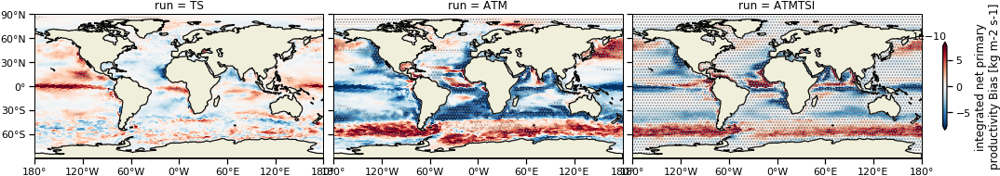

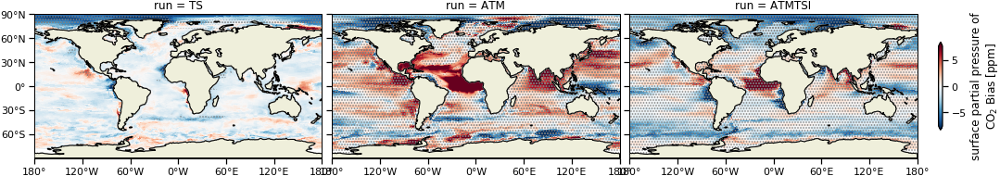

In [89]:
fg = tp.sel(metric="bias").map(plot_map_contour, feature='land')
merge(metric='bias',new_name=new_name, contour='std')

CPU times: user 1min 58s, sys: 8.83 s, total: 2min 7s
Wall time: 23.9 s


'map_bias_mbgc_contour_std.png'

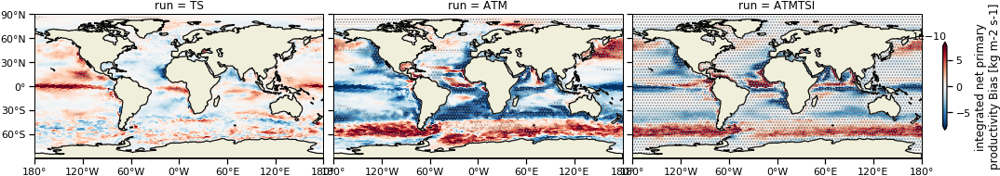

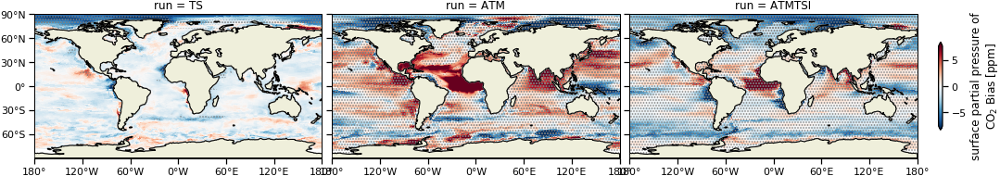

In [90]:
%%time
fg = tp.sel(metric="bias").map(plot_map_contour, feature='land')
merge(metric='bias',new_name=new_name, contour='std')

#### ACC

'map_pearson_r_mbgc_contour_95th.png'

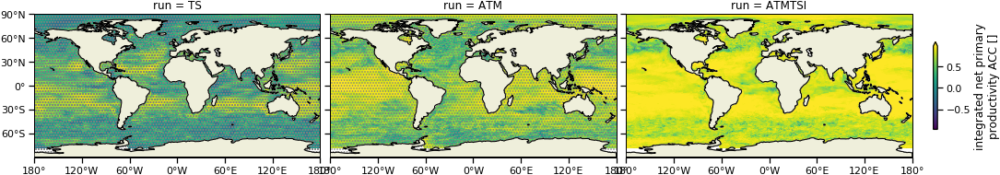

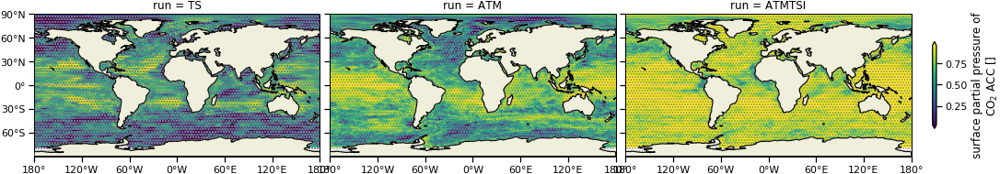

In [91]:
metric="pearson_r"
_ = tp.sel(metric=metric).map(plot_map_contour, feature='land')
merge(metric=metric,new_name=new_name, contour='95th')

#### rmse

'map_rmse_mbgc_contour_5th.png'

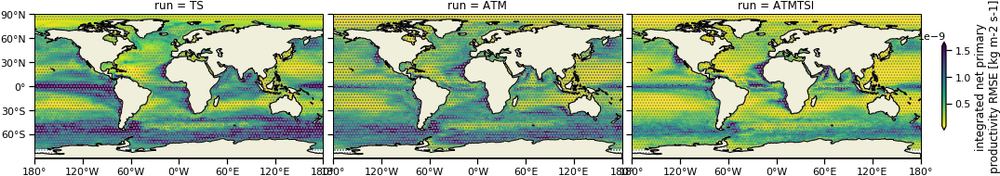

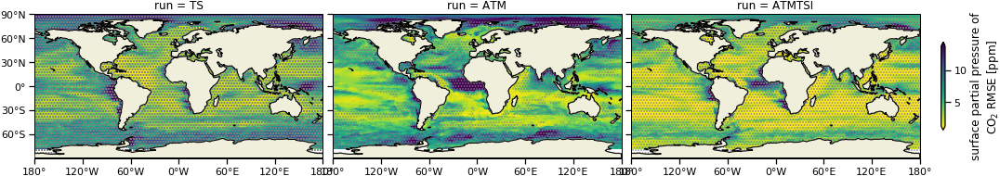

In [92]:
metric="rmse"
_ = tp.sel(metric=metric).map(plot_map_contour, feature='land')
merge(metric=metric,new_name=new_name, contour='5th')

#### debiased rmse

In [93]:
dszym_debiased = debias(dszym,cut=CUT,how=how_debias)
tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()

'map_debiased_rmse_mbgc_contour_5th.png'

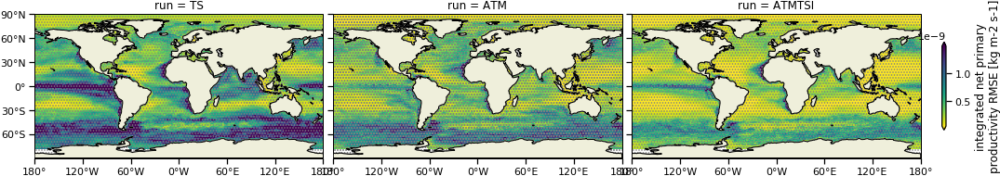

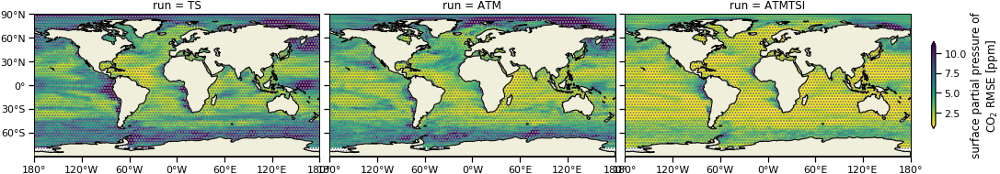

In [94]:
_ = tp_debiased.sel(metric='rmse').map(plot_map_contour, feature='land')
merge(metric='debiased_rmse',new_name=new_name, contour='5th')

## terrestrial biogeochemistry

In [122]:
varlist_tbgc = [v for v in atmvarlist if output_df2.loc[v]["model"] in ["jsbach",'echam6']]
varlist_tbgc

['wind10',
 'u10',
 'v10',
 'temp2',
 'CO2',
 'co2_flux',
 'co2_flx_ocean',
 'co2_flx_land',
 'precip',
 'co2_flx_npp',
 'co2_flx_resp',
 'tsw',
 'slp',
 'ws',
 'lai',
 'box_Cpools_total']

In [123]:
# get Total Carbon in all Terrestrial Carbon Pools [Gt]

In [149]:
varlist_tbgc = ['lai','ws','box_Cpools_total','co2_flx_land']

In [132]:
new_name='tbgc'
feature='ocean'

In [126]:
dsz = xr.open_zarr(atm_zarr)[varlist_tbgc]
dsz = clean(convert_C(dsz)).sel(run=indirect_run)
dszym = yearmean(dsz).chunk({"time": -1}).persist()

for v in long_name_rename_dict.keys():
    if v in dszym.data_vars:
        dszym[v].attrs['long_name'] = long_name_rename_dict[v]

converted co2_flx_land from CO2 units to C units.
converted box_Cpools_total from mol(CO2) to kgC


### ym tracking performance maps

In [127]:
#mean = dszym.sel(run=c).mean("time").compute()
#std = dszym.sel(run=c).std("time").compute()
%time tp = metrics_over_time(dszym, metrics=run_metrics).mean("time").compute()

CPU times: user 34.6 s, sys: 6.94 s, total: 41.5 s
Wall time: 24.7 s


In [128]:
%time rt_pearson_r = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='pearson_r').chunk({'iteration':-1}).quantile(.95,'iteration', skipna=True).compute()
rt_rmse = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='rmse').chunk({'iteration':-1}).quantile(.05,'iteration', skipna=True).compute()
rt_mae = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='mae').chunk({'iteration':-1}).quantile(.05,'iteration', skipna=True).compute()

CPU times: user 35.7 s, sys: 5.03 s, total: 40.7 s
Wall time: 27.4 s


#### bias
ATM nuding brings regional mean bias

In [ ]:
%%time
fg = tp.sel(metric="bias").map(plot_map_contour, feature=feature)
merge(metric='bias',new_name=new_name, contour='std')

#### ACC

'map_pearson_r_tbgc_contour_95th.png'

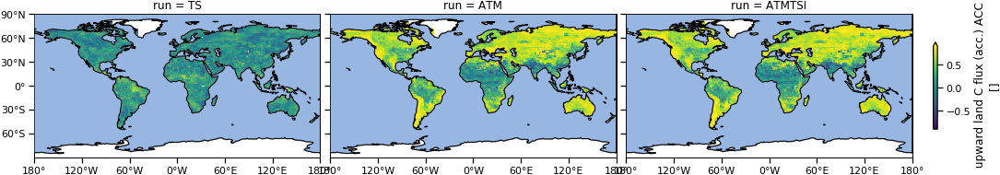

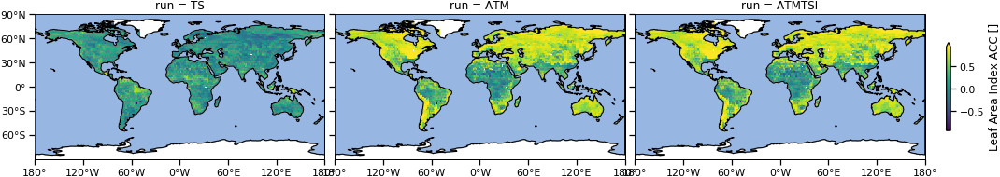

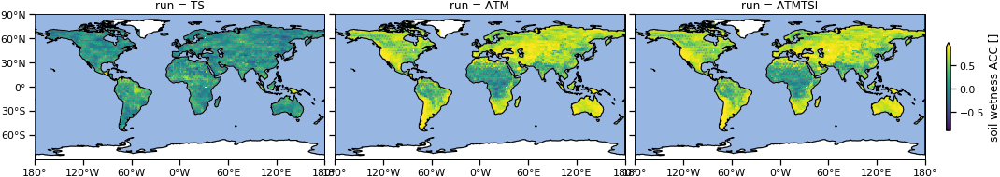

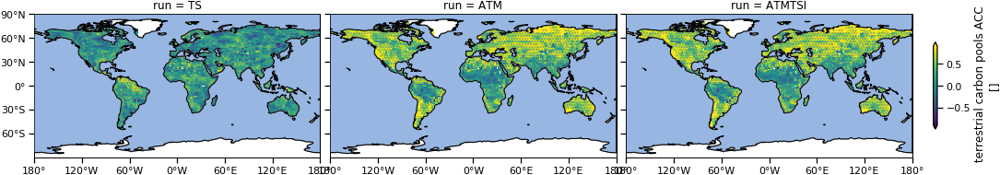

In [130]:
metric="pearson_r"
_ = tp.sel(metric=metric).map(plot_map_contour, feature=feature)
merge(metric=metric,new_name=new_name, contour='95th')

#### rmse

'map_rmse_tbgc_contour_5th.png'

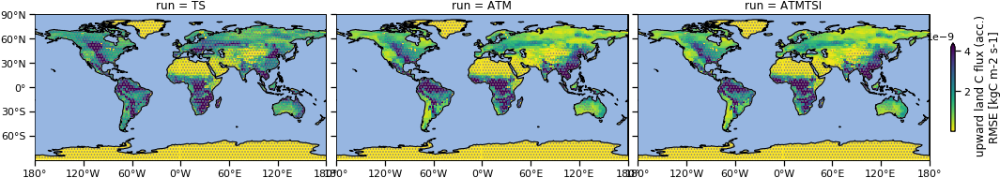

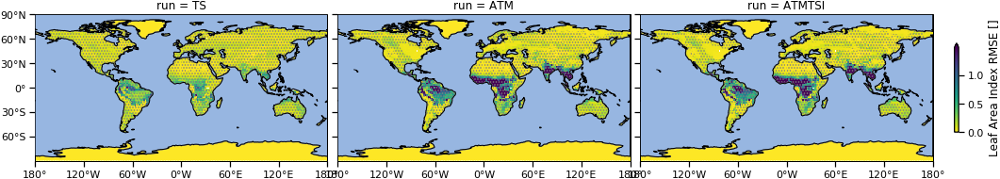

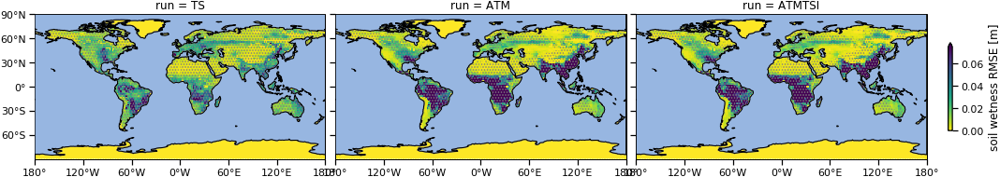

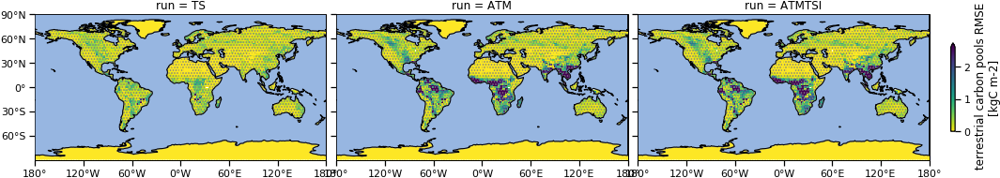

In [131]:
metric="rmse"
_ = tp.sel(metric=metric).map(plot_map_contour, feature=feature)
merge(metric=metric,new_name=new_name, contour='5th')

#### unbiased rmse

In [132]:
dszym_debiased = debias(dszym,cut=CUT,how=how_debias)
%time tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()

CPU times: user 3min 5s, sys: 38 s, total: 3min 43s
Wall time: 2min 30s


'map_debiased_rmse_tbgc_contour_5th.png'

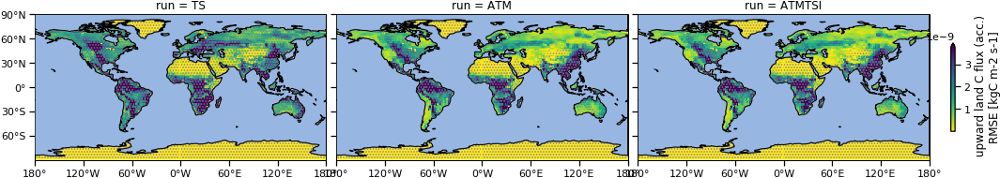

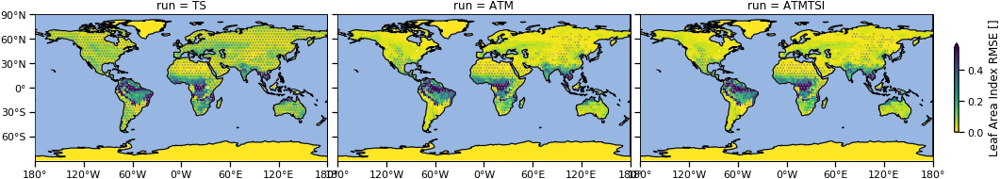

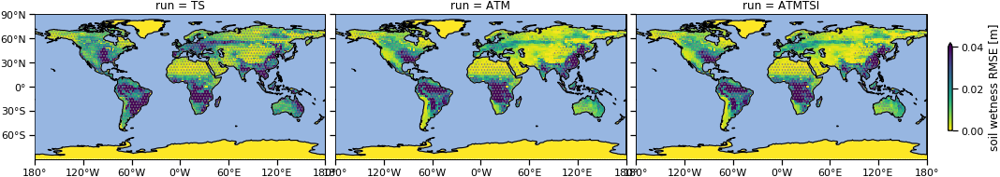

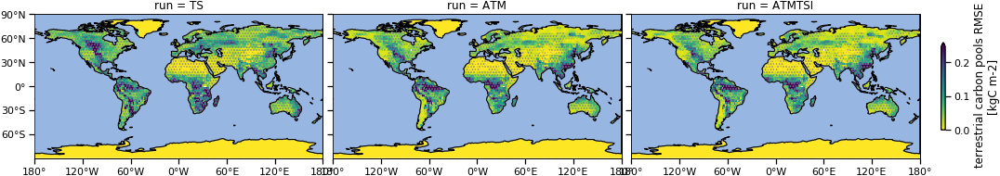

In [133]:
_ = tp_debiased.sel(metric='rmse').map(plot_map_contour, feature=feature)
merge(metric='debiased_rmse',new_name=new_name, contour='5th')

## Misc

In [67]:
run_carbon = [c,'TS','ATM','ATMTSI','ATMTSIDICALK','ATMTSIDICALKNUT','ATMTSIlandrall','ATMTSIDICALKlandr','ATMTSIDICALKlandR','ATMTSIDICALKland2']

In [70]:
#land_unit = land_area / land_area
#lat_30_mask = land_unit.where(land_area.lat>30,other=0)+(land_unit*2).where(land_area.lat<-30,other=0)
#lat_30_mask.plot()

#dszr = to_regions(dsz, mask=lat_30_mask)

#dszr = dszr.sel(region=[1,0,2])
#dszr['region']=['90N-30N','30N-30S','30S-90S']

#%time dszr = dszr.compute()

In [ ]:
### different direct_runs

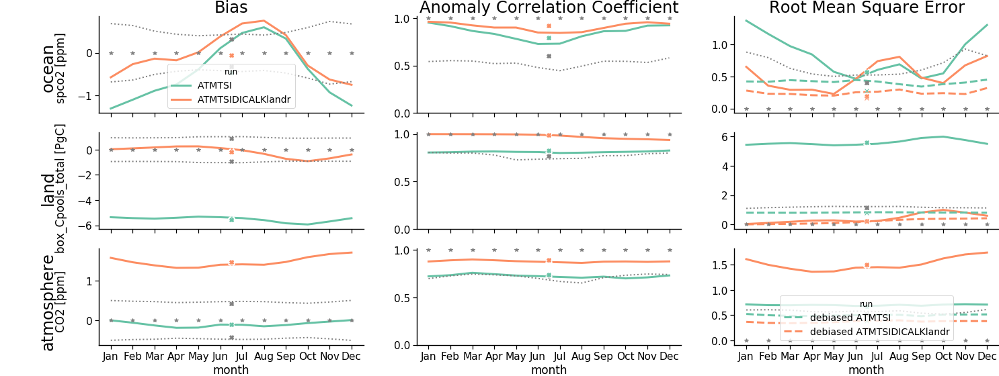

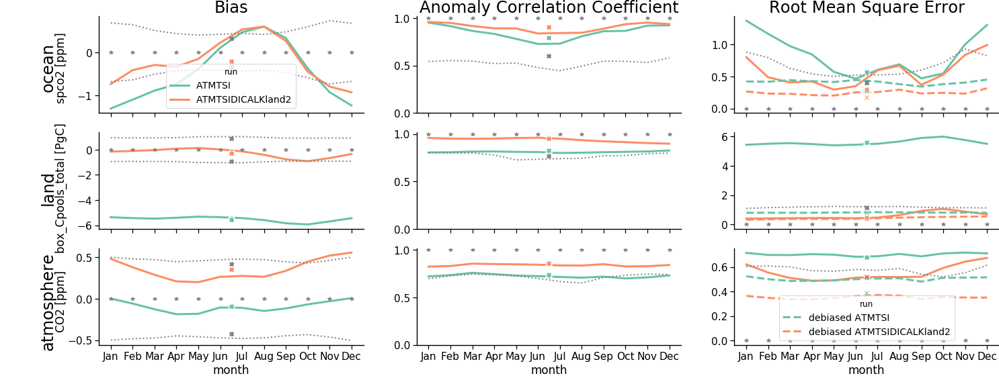

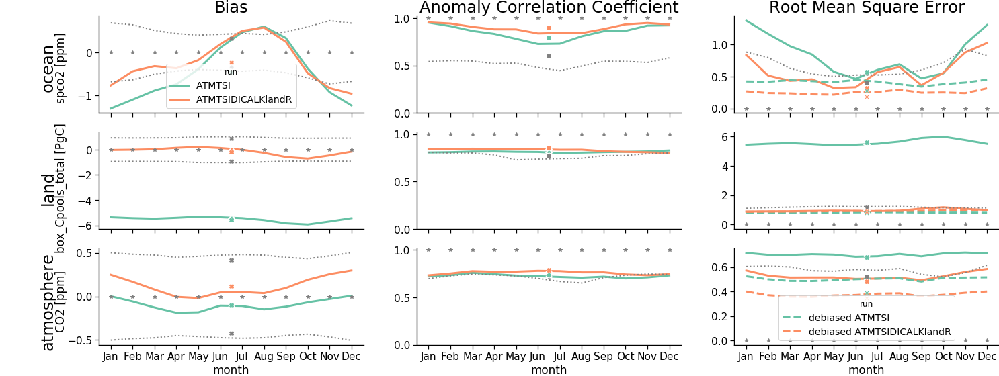

In [129]:
for direct_run in direct_runs:
    plot_plot_metric_over_month_indirect_direct_many(tpm[['spco2','box_Cpools_total','CO2']], direct_run=direct_run,label=new_name,rowlabel=['ocean','land','atmosphere'],
                                                 pub_ready=True)
    os.rename('metrics_month_in_direct_carbon_region_global.png', f'metrics_month_in_direct_carbon_region_global_land{direct_run[-1]}.png')

# Misc

In [41]:
def plot_timeseries(dss, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(15, 3))
    if c in dss.run:
        dssc = dss.sel(run=c)
        dssc.plot(c="k", lw=4, zorder=10)
        dssr = dss.drop_sel(run=c)
    else:
        dssr = dss
    p = dssr.plot(hue="run", alpha=0.7)
    sns.despine()
    # try:
    #    ax.set_title(dss.coords["names"].values)
    # except:
    #    pass
    plt.legend(p, dss.run.values, loc="center left", bbox_to_anchor=(1, 0.5))

## spatial aggregation

In [46]:
name = "srex"
srex = getattr(regionmask.defined_regions, name)

In [47]:
name = "Longhurst"
gdf = geopandas.read_file(f"/home/mpim/m300524/.regionmask_data/{name}/{name}.shp")

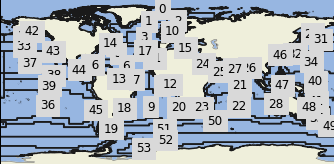

In [48]:
Longhurst = regionmask.from_geopandas(gdf, names="ProvDescr", abbrevs="ProvCode")
Longhurst.plot(add_land=True, add_ocean=True)

In [49]:
def to_regions(ds, region=None, agg_regions=None, mask=None):
    if "x" in ds.dims and "y" in ds.dims:
        stack_dims = "stacked_y_x"
        area = ocean_area
        if region is None and mask is None:
            region = ocean_regions
    elif "lat" in ds.dims and "lat" in ds.dims:
        stack_dims = "stacked_lat_lon"
        area = land_area
        if region is None and mask is None:
            region = srex_regions
    if mask is None and region is not None:
        mask = region.mask(ds)
    mask.name = "region"

    ds_sm = (ds * area).groupby(mask).sum(stack_dims)
    if isinstance(ds, xr.DataArray):
        ds = ds.to_dataset()
        was_dataset = False
    else:
        was_dataset = True

    if agg_regions is not None:
        print("found agg_regions:", agg_regions)

    ds_sm = ds_sm.map(
        reduce_unit_by_area_and_maybe_agg,
        agg_regions=agg_regions,
        mask=mask,
        area=area,
        stack_dims=stack_dims,
        keep_attrs=True,
    )
    if agg_regions == None and region is not None:
        ds_sm = set_regionmask_labels(ds_sm, region)

    if not was_dataset:
        ds_sm = ds_sm.to_array()
    return ds_sm

In [50]:
def reduce_unit_by_area_and_maybe_agg(
    da_sm, agg_regions=None, stack_dims=None, mask=None, area=None
):
    if "units" in da_sm.attrs:
        units = da_sm.attrs["units"]
        if "m-2" in units or "m-3" in units:
            da_sm.attrs["units"] = (
                da_sm.attrs["units"].replace("m-2", "").replace("m-3", "m-1")
            )
            da_sm = get_agg_regions(da_sm, agg_regions=agg_regions, how="sum")
        #if 'grid box' in units:
        #    da_sm = da_sm / (area.groupby(mask).sum(stack_dims))
        #    da_sm.attrs["units"] = da_sm.attrs["units"].replace('(grid box)','')
        else:
            assert da_sm.region.size > 0
            da_sm = da_sm / (area.groupby(mask).sum(stack_dims))
            assert da_sm.region.size > 0
            da_sm = get_agg_regions(da_sm, agg_regions=agg_regions, how="mean")
            assert da_sm.region.size > 0
    else: # if no units found spatial mean
        da_sm = da_sm / (area.groupby(mask).sum(stack_dims))
        da_sm = get_agg_regions(da_sm, agg_regions=agg_regions, how="mean")
    return da_sm


def set_regionmask_labels(ds, region):
    # extract the abbreviations and the names of the regions from regionmask
    abbrevs = region[ds.region.values].abbrevs
    names = region[ds.region.values].names
    ds.coords["abbrevs"] = ("region", abbrevs)
    ds.coords["names"] = ("region", names)
    return ds


agg_regions = {
    "Southern Ocean": [50, 51, 49],
    "Tropical Pacific": [39, 40, 38],
    "North Pacific": [30, 31, 29, 33],
    "North Atlantic": [2, 3, 1],
}


def get_agg_regions(ds_sm, agg_regions=agg_regions, how="mean"):
    """Aggregate regions based on `agg_regions` for analysis from Longhurst predefined regions."""
    if agg_regions is None:
        return ds_sm
    ds_agg_list = []
    for key, value in agg_regions.items():
        ds_agg_list.append(getattr(ds_sm.sel(region=value), how)("region"))
    ds_sm_agg = xr.concat(ds_agg_list, "region")
    ds_sm_agg["region"] = list(agg_regions.keys())
    return ds_sm_agg

## Composites

### CVDP

In [53]:
f = !ls /work/bm1124/m300524/experiments/vga0220a_Rerun/outdata/cvdp/*.nc

f = [i.split("/")[-1] for i in f]
f = [".".join(i.split(".")[2:-2]) for i in f]

In [51]:
# postpath = "./"
targetyear, baseyear = 1850, 2006
recompute = False
# indexfilename = "psl.sam_psa"
# indexfilename = "sst.indices"
for indexfilename in f:
    print(indexfilename)
    if recompute:
        ds_list = []
        runs_found = []
        for assim in runs:
            try:
                expid = f"asp_esmControl_PMassim_{targetyear}_{assim}_over_{baseyear}"
                if assim == c:
                    expid = assim
                cvdp_path = f"{workpath}{expid}/outdata/cvdp"
                # files=f'{cvdp_path}/{expid}.cvdp_data.psl.nam_nao.3170-3269.nc'
                files = f"{cvdp_path}/{expid}.cvdp_data.{indexfilename}.1850-1898.nc"
                ds = xr.open_mfdataset(files, decode_times=False)  # ,concat_dim='time')
                ds_list.append(ds)
                runs_found.append(assim)
                # print(f"{assim} success")
            except Exception as e:
                print(f"{assim} failed: {e}")
        ds_cvdp = xr.concat(ds_list, "run")
        ds_cvdp["run"] = runs_found
        ds_cvdp = ds_cvdp.load()
        filename = f"./PMassim_{targetyear}_over_{baseyear}_{indexfilename}_CVDP.nc"
        ds_cvdp.to_netcdf(filename)
        print(ds_cvdp.nbytes / 1e6, "MB")
        try:
            ds_cvdp["time"] = xr.cftime_range(
                start="1850", freq="MS", periods=ds_cvdp.time.size
            )
        except:
            pass

amo
pdo
pr.mean_stddev
pr.trends_timeseries
psl.mean_stddev
psl.nam_nao
psl.nam_nao.ts
psl.pna_npo
psl.pna_npo.ts
psl.sam_psa
psl.sam_psa.ts
psl.sst.indices.tas
psl.trends
snd.mean_stddev
snd.trends
sst.indices
sst.indices.ppt
sst.indices.psl
sst.mean_stddev
sst.trends_timeseries
tas.mean_stddev
tas.trends_timeseries


In [ ]:
indexfilename = "sst.indices"
filename = f"./PMassim_{targetyear}_over_{baseyear}_{indexfilename}_CVDP.nc"
ds_cvdp = xr.open_dataset(filename, decode_times=False).load()

In [183]:
indexfilename_dict=dict()
indexfilename_dict['sam'] = 'psl.sam_psa'
indexfilename_dict['nao'] = 'psl.nam_nao'

In [206]:
clim_indices = ['pdo','amo', 'sam','nao']
clim_indices_ds = []
ta = 'mon'
for index in clim_indices:
    indexfilename = indexfilename_dict[index] if index in indexfilename_dict else index
    filename = f"/work/bm1124/m300524/experiments/vga0220a_Rerun/outdata/cvdp/vga0220a_Rerun.cvdp_data.{indexfilename}.1850-1898.nc"
    indexvarname = f'{index}_pc_{ta}' if index in ['sam','nao'] else f'{index}_timeseries_{ta}'
    clim_indices_ds.append(xr.open_dataset(filename, decode_times=False)[indexvarname])

filename = f"/work/bm1124/m300524/experiments/vga0220a_Rerun/outdata/cvdp/vga0220a_Rerun.cvdp_data.sst.indices.1850-1898.nc"
tindices = ['nino34','nino12','nino3','nino4','southern_ocean']
for i in tindices:
    clim_indices_ds.append(xr.open_dataset(filename, decode_times=False)[i])

clim_indices_ds = xr.concat(clim_indices_ds,'index').load()
clim_indices_ds['index'] = clim_indices+tindices

clim_indices_ds['time']=xr.cftime_range(start='1850',freq='MS',periods=clim_indices_ds.time.size)

In [207]:
clim_indices_ds = (clim_indices_ds-clim_indices_ds.mean('time'))/clim_indices_ds.std('time')

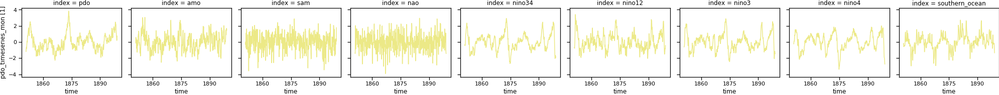

In [209]:
clim_indices_ds.isel(time=slice(12,None)).plot(col='index')

In [49]:
sruns = dict()
sruns["spco2"] = ["ATM", "TSI", "ATMTSI", "ATMTSIDICALK"]
sruns["tos"] = ["ATM", "TSI", "ATMsfnTS", "ATMTSI"]
default_runs = ["SSTSSS", "TS", "ATM", "ATMTSI"]


def plot_composites_diff(comp_diff, feature=None):
    v = comp_diff.name
    if output_df2.loc[v].model in ["jsbach", "echam6"]:
        # plot atm
        import cartopy.crs as ccrs

        p = comp_diff.sel(run=sruns.get(v, default_runs)).plot(
            col="run",
            row="index",
            aspect=2.4,
            subplot_kws={"projection": ccrs.PlateCarree()},
            transform=ccrs.PlateCarree(),
            robust=True,
        )
        for ax in p.axes.flat:
            ax.coastlines()
    elif output_df2.loc[v].model in ["mpiom", "hamocc"]:
        # plot ocean
        ctm = sns.plotting_context(
            "talk",  # rc={"lines.linewidth": 1.5, "axes.grid": True, "axes.labelsize": "small"}
        )
        with sns.plotting_context(ctm):
            comp_diff.sel(run=sruns.get(v, default_runs)).plot_map(
                col="run", row="index", aspect=2.4, feature=feature
            )
            plt.suptitle(
                f"{indexstr} composites: Difference: run - target",
                y=1,
                x=0.4,
                fontsize="large",
            )
            if savefig:
                plt.savefig(f"{indexstr}_composite_{v}.jpg")
    else:
        comp_diff[v].sel(run=sruns[v]).plot(col="run", row="index", **pa)

### composites

In [ ]:
index='amo'

In [ ]:
comp = et.composite.composite_analysis(dsz.chunk({"run": 1}), clim_indices_ds.sel(index=index))
# comp

%time comp=comp.compute()

comp_diff = diff_c(comp)

In [ ]:
_ = comp_diff.map(plot_composites_diff)

## spco2 decomposition

In [55]:
name = "ocean"
zarrpath = f"{postpath}/{name}.zarr"
dsz = xr.open_zarr(zarrpath)

In [576]:
# global mean
# dsz = global_agg(dsz)
# dsz = dsz.compute()

In [577]:
# dont aggregate time before
# dsz = dsz.groupby("time.year").mean().rename({"year": "time"})

In [579]:
from esmtools.carbon import spco2_sensitivity, spco2_decomposition

dsz2 = dsz[["dissicos", "spco2", "tos", "sos", "talkos"]]

spco2_decomp = spco2_decomposition(
    dsz2, detrend=False, deseasonalize=True
)  # .compute()

In [580]:
# sum up contributions
spco2_decomp["sum"] = spco2_decomp.to_array().sum("variable")

# add actual spco2 anomalies to dataset
spco2_decomp["spco2"] = dsz2["spco2"] - dsz2["spco2"].mean("time")

In [581]:
# afterwards ok but not before
spco2_decomp = spco2_decomp.groupby("time.year").mean().rename({"year": "time"})

In [ ]:
%time spco2_decomp = spco2_decomp.compute()

In [ ]:
# quick plot
if len(spco2_decomp.dims)>3:
    spco2_decomp.to_array().isel(time=range(4)).plot(
        row="variable", col="time", robust=True, yincrease=False
    )
else:
    spco2_decomp.to_array().plot(hue='variable',row='run',figsize=(20,30))
    plt.ylim([-5,5])
    #plt.xlim(['1850','1898'])

In [64]:
# diff to control
#diff_c(spco2_decomp).to_array().plot(hue='variable',row='run',figsize=(20,30))
#plt.ylim([-5,5])

In [ ]:
import esmtools as et

index = cvdp_indices["nino34"].sel(run='vga0220a_Rerun')
%time comp = et.composite.composite_analysis(spco2_decomp, index)

In [ ]:
%time comp=comp.compute()

In [ ]:
comp